In [0]:
#WEEK 1:

import pandas as pd

# Load the dataset into Pandas
df = pd.read_csv("/Volumes/workspace/default/flight_delay_data_file/Flight_delay.csv")

# Show basic info
print(df.shape)
print(df.dtypes)
df.head()


(484551, 32)
DayOfWeek             int64
Date                 object
DepTime               int64
ArrTime               int64
CRSArrTime           object
UniqueCarrier        object
Airline              object
FlightNum             int64
TailNum              object
ActualElapsedTime     int64
CRSElapsedTime        int64
AirTime               int64
ArrDelay              int64
DepDelay              int64
Origin               object
Org_Airport          object
Dest                 object
Dest_Airport         object
Distance              int64
TaxiIn                int64
TaxiOut               int64
Cancelled             int64
CancellationCode     object
Diverted              int64
CarrierDelay          int64
WeatherDelay          int64
NASDelay              int64
SecurityDelay         int64
LateAircraftDelay     int64
Month                 int64
DepHour               int64
Route                object
dtype: object


,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,Month,DepHour,Route
0,4,2019-03-01,1829,1959,1900-01-01 19:25:00,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore-Washington International Airport,515,3,10,0,N,0,2,0,0,0,32,3,18,IND_BWI
1,4,2019-03-01,1937,2037,1900-01-01 19:40:00,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport,1591,3,7,0,N,0,10,0,0,0,47,3,19,IND_LAS
2,4,2019-03-01,1644,1845,1900-01-01 17:25:00,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,8,0,0,0,72,3,16,IND_MCO
3,4,2019-03-01,1452,1640,1900-01-01 16:25:00,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,3,0,0,0,12,3,14,IND_PHX
4,4,2019-03-01,1323,1526,1900-01-01 15:10:00,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,16,3,13,IND_TPA


In [0]:
# Schema and data types
print(pdf.info())

# Memory usage
print("Memory usage (MB):", round(pdf.memory_usage(deep=True).sum() / 1024**2, 2))

# Count nulls
print(pdf.isnull().sum())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 484551 entries, 0 to 484550
Data columns (total 29 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   DayOfWeek          484551 non-null  int64 
 1   Date               484551 non-null  object
 2   DepTime            484551 non-null  int64 
 3   ArrTime            484551 non-null  int64 
 4   CRSArrTime         484551 non-null  int64 
 5   UniqueCarrier      484551 non-null  object
 6   Airline            484551 non-null  object
 7   FlightNum          484551 non-null  int64 
 8   TailNum            484551 non-null  object
 9   ActualElapsedTime  484551 non-null  int64 
 10  CRSElapsedTime     484551 non-null  int64 
 11  AirTime            484551 non-null  int64 
 12  ArrDelay           484551 non-null  int64 
 13  DepDelay           484551 non-null  int64 
 14  Origin             484551 non-null  object
 15  Org_Airport        483374 non-null  object
 16  Dest               4

In [0]:
# Sampling 1% of data for faster testing
sample_df = df.sample(frac=0.01, random_state=42)

# Optimize memory usage
for col in df.select_dtypes(include='int64').columns:
    df[col] = pd.to_numeric(df[col], downcast='integer')
for col in df.select_dtypes(include='float64').columns:
    df[col] = pd.to_numeric(df[col], downcast='float')

print("Optimized Memory (MB):", round(df.memory_usage(deep=True).sum() / 1024**2, 2))


Optimized Memory (MB): 334.83


In [0]:
#WEEK 2:

# Fill delays with 0 if missing
delay_cols = ["DepDelay", "ArrDelay", "CarrierDelay", "WeatherDelay", "NASDelay", "SecurityDelay", "LateAircraftDelay"]
for col in delay_cols:
    if col in df.columns:
        df[col] = df[col].fillna(0)

# Fill cancellations with 0
if "Cancelled" in df.columns:
    df["Cancelled"] = df["Cancelled"].fillna(0)

print(df.display())


DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,Month,DepHour,Route
4,2019-03-01,1829,1959,1900-01-01 19:25:00,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore-Washington International Airport,515,3,10,0,N,0,2,0,0,0,32,3,18,IND_BWI
4,2019-03-01,1937,2037,1900-01-01 19:40:00,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport,1591,3,7,0,N,0,10,0,0,0,47,3,19,IND_LAS
4,2019-03-01,1644,1845,1900-01-01 17:25:00,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,8,0,0,0,72,3,16,IND_MCO
4,2019-03-01,1452,1640,1900-01-01 16:25:00,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,3,0,0,0,12,3,14,IND_PHX
4,2019-03-01,1323,1526,1900-01-01 15:10:00,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,16,3,13,IND_TPA
4,2019-03-01,1416,1512,1900-01-01 14:35:00,WN,Southwest Airlines Co.,54,N643SW,56,70,49,37,51,ISP,Long Island MacArthur Airport,BWI,Baltimore-Washington International Airport,220,2,5,0,N,0,12,0,0,0,25,3,14,ISP_BWI
4,2019-03-01,1657,1754,1900-01-01 17:35:00,WN,Southwest Airlines Co.,623,N724SW,57,70,47,19,32,ISP,Long Island MacArthur Airport,BWI,Baltimore-Washington International Airport,220,5,5,0,N,0,7,0,0,0,12,3,16,ISP_BWI
4,2019-03-01,1422,1657,1900-01-01 16:10:00,WN,Southwest Airlines Co.,188,N215WN,155,195,143,47,87,ISP,Long Island MacArthur Airport,FLL,Fort Lauderdale-Hollywood International Airport,1093,6,6,0,N,0,40,0,0,0,7,3,14,ISP_FLL
4,2019-03-01,2107,2334,1900-01-01 22:30:00,WN,Southwest Airlines Co.,362,N798SW,147,165,134,64,82,ISP,Long Island MacArthur Airport,MCO,Orlando International Airport,972,6,7,0,N,0,5,0,0,0,59,3,21,ISP_MCO
4,2019-03-01,1812,1927,1900-01-01 18:15:00,WN,Southwest Airlines Co.,422,N779SW,135,145,118,72,82,ISP,Long Island MacArthur Airport,MDW,Chicago Midway International Airport,765,6,11,0,N,0,3,0,0,0,69,3,18,ISP_MDW


None


In [0]:
# Convert Date to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Month, Day of Week, Hour
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['DepHour'] = (df['DepTime'] // 100).astype('Int64')

# Route = Origin-Destination
if "Origin" in df.columns and "Dest" in df.columns:
    df['Route'] = df['Origin'] + "_" + df['Dest']


In [0]:
# Ensure all datetime fields are properly formatted
if "CRSDepTime" in df.columns:
    df['CRSDepTime'] = pd.to_datetime(df['CRSDepTime'], format='%H%M', errors='coerce')
if "CRSArrTime" in df.columns:
    df['CRSArrTime'] = pd.to_datetime(df['CRSArrTime'], format='%H%M', errors='coerce')


In [0]:
# Save preprocessed dataset for reuse
df.to_csv("/Volumes/workspace/default/flight_delay_data_file/Flight_delay.csv", index=False)

print("✅ Preprocessed dataset saved!")


✅ Preprocessed dataset saved!


In [0]:
# Save cleaned dataframe as CSV
df.to_csv("/Volumes/workspace/default/flight_delay_data_file/Flight_delay.csv", index=False)

# Reload the saved file
df_check = pd.read_csv("/Volumes/workspace/default/flight_delay_data_file/Flight_delay.csv")

print(df_check.shape)
df_check.head()


(484551, 32)


,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,Month,DepHour,Route
0,4,2019-03-01,1829,1959,NaN,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore-Washington International Airport,515,3,10,0,N,0,2,0,0,0,32,3,18,IND_BWI
1,4,2019-03-01,1937,2037,NaN,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport,1591,3,7,0,N,0,10,0,0,0,47,3,19,IND_LAS
2,4,2019-03-01,1644,1845,NaN,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,8,0,0,0,72,3,16,IND_MCO
3,4,2019-03-01,1452,1640,NaN,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,3,0,0,0,12,3,14,IND_PHX
4,4,2019-03-01,1323,1526,NaN,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,16,3,13,IND_TPA


In [0]:
#WEEK 3:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load cleaned dataset
df = pd.read_csv("/Volumes/workspace/default/flight_delay_data_file/Flight_delay.csv")

# Display first 5 rows
print(df.shape)
#print(df.display())
df.head()


(484551, 32)


,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,Month,DepHour,Route
0,4,2019-03-01,1829,1959,NaN,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore-Washington International Airport,515,3,10,0,N,0,2,0,0,0,32,3,18,IND_BWI
1,4,2019-03-01,1937,2037,NaN,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport,1591,3,7,0,N,0,10,0,0,0,47,3,19,IND_LAS
2,4,2019-03-01,1644,1845,NaN,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,8,0,0,0,72,3,16,IND_MCO
3,4,2019-03-01,1452,1640,NaN,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,3,0,0,0,12,3,14,IND_PHX
4,4,2019-03-01,1323,1526,NaN,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,16,3,13,IND_TPA


/home/spark-5ba4509f-010f-40a9-a80a-7d/.ipykernel/2444/command-6311237353508871-3666634775:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=top_airlines.index, x=top_airlines.values, palette="coolwarm")


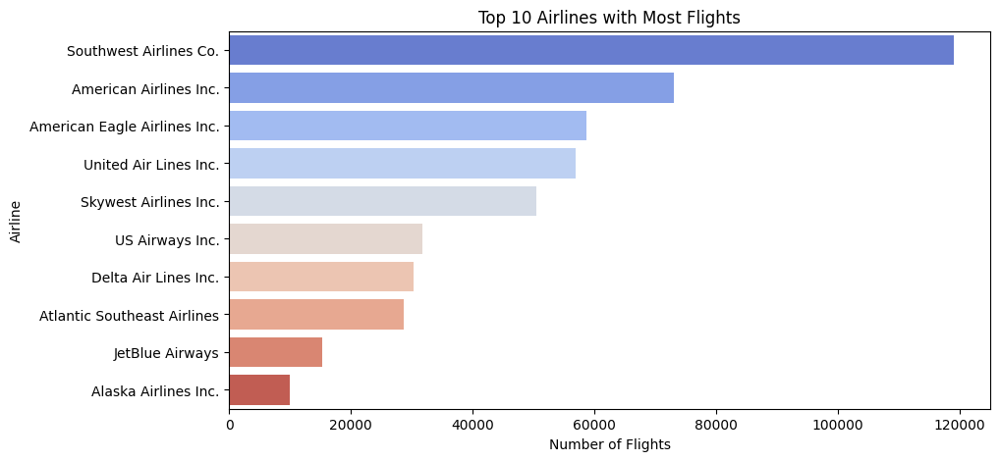

In [0]:
#Top 10 Airlines with Most Flights:

plt.figure(figsize=(10,5))
top_airlines = df['Airline'].value_counts().head(10)
sns.barplot(y=top_airlines.index, x=top_airlines.values, palette="coolwarm")
plt.title("Top 10 Airlines with Most Flights")
plt.ylabel("Airline")
plt.xlabel("Number of Flights")
plt.show()


/home/spark-5ba4509f-010f-40a9-a80a-7d/.ipykernel/2444/command-6311237353508877-793681441:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=top_routes.index, x=top_routes.values, palette="mako")


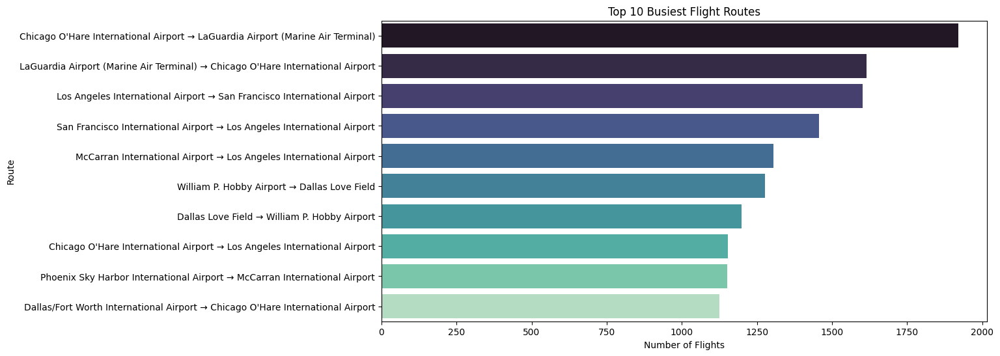

In [0]:
#Top 10 Busiest Routes:

df['Route'] = df['Org_Airport'] + " → " + df['Dest_Airport']
top_routes = df['Route'].value_counts().head(10)

plt.figure(figsize=(12,6))
sns.barplot(y=top_routes.index, x=top_routes.values, palette="mako")
plt.title("Top 10 Busiest Flight Routes")
plt.xlabel("Number of Flights")
plt.ylabel("Route")
plt.show()


/home/spark-5ba4509f-010f-40a9-a80a-7d/.ipykernel/2444/command-6311237353508878-1969964813:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Month', data=df, palette='viridis')


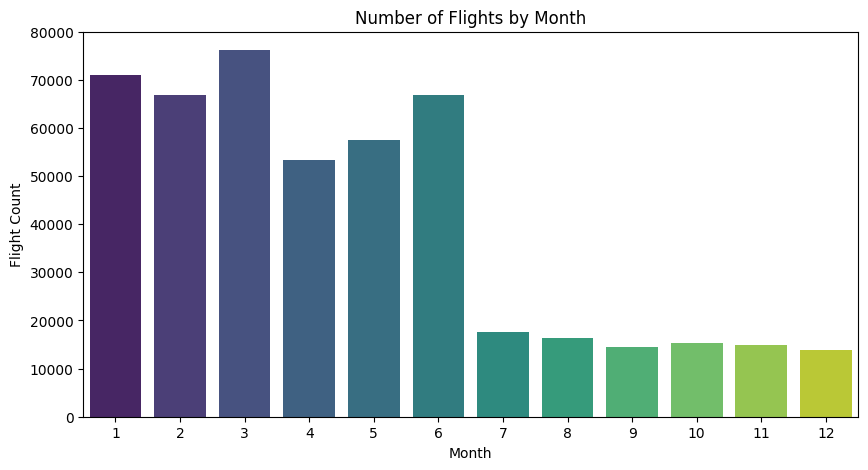

In [0]:
#Busiest Months (Flight Distribution by Month):

# Extract month from date column
df['Month'] = pd.to_datetime(df['Date']).dt.month

plt.figure(figsize=(10,5))
sns.countplot(x='Month', data=df, palette='viridis')
plt.title("Number of Flights by Month")
plt.xlabel("Month")
plt.ylabel("Flight Count")
plt.show()


/home/spark-5ba4509f-010f-40a9-a80a-7d/.ipykernel/2444/command-6079244816134621-235382737:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='DayOfWeek', data=df, palette='cubehelix')


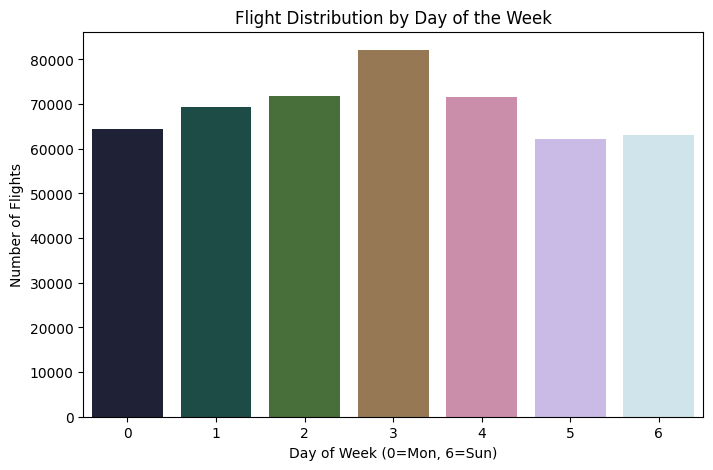

In [0]:
#Flight Distribution by Day of Week:

plt.figure(figsize=(8,5))
sns.countplot(x='DayOfWeek', data=df, palette='cubehelix')
plt.title("Flight Distribution by Day of the Week")
plt.xlabel("Day of Week (0=Mon, 6=Sun)")
plt.ylabel("Number of Flights")
plt.show()


/home/spark-5ba4509f-010f-40a9-a80a-7d/.ipykernel/2444/command-6079244816134622-3856951244:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='DepTimePeriod', data=df, order=['Early Morning','Morning','Afternoon','Evening'], palette='cool')


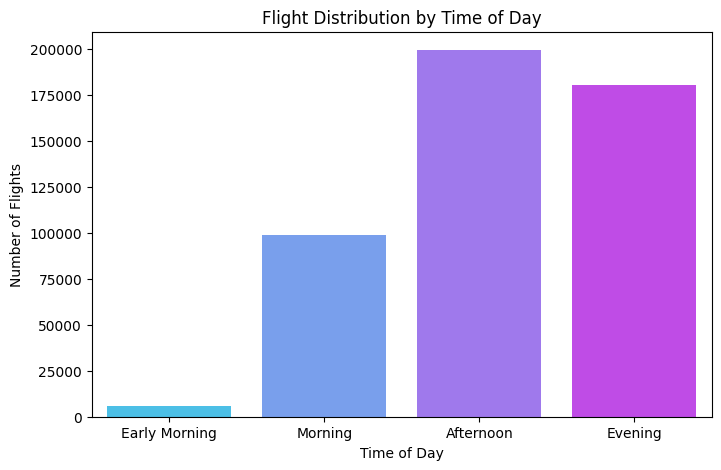

In [0]:
#Flight Distribution by Time of Day:
def get_time_of_day(dep_time):
    if dep_time < 600:
        return 'Early Morning'
    elif dep_time < 1200:
        return 'Morning'
    elif dep_time < 1800:
        return 'Afternoon'
    else:
        return 'Evening'

df['DepTimePeriod'] = df['DepTime'].apply(get_time_of_day)

plt.figure(figsize=(8,5))
sns.countplot(x='DepTimePeriod', data=df, order=['Early Morning','Morning','Afternoon','Evening'], palette='cool')
plt.title("Flight Distribution by Time of Day")
plt.xlabel("Time of Day")
plt.ylabel("Number of Flights")
plt.show()


/home/spark-5ba4509f-010f-40a9-a80a-7d/.ipykernel/2444/command-6079244816134623-2353348350:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='UniqueCarrier', y='ArrDelay', data=df, palette='Set3')


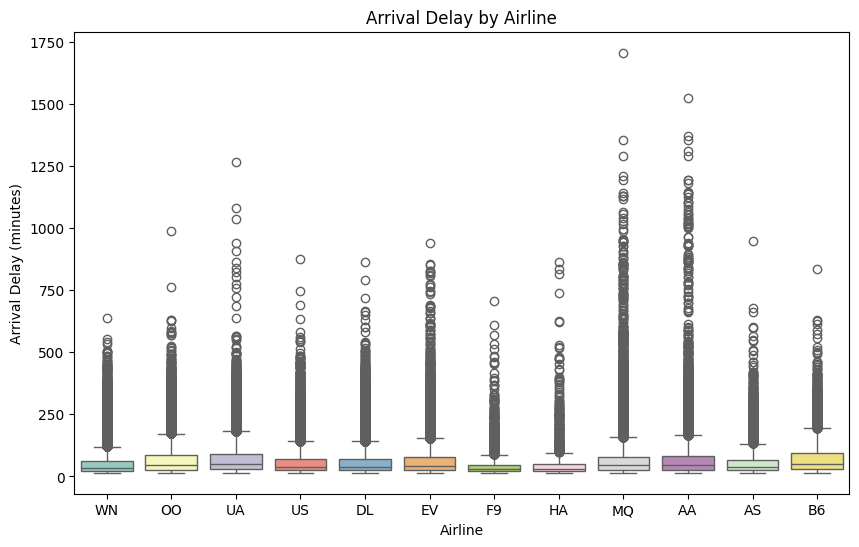

In [0]:
#Delay Analysis by Airline:
plt.figure(figsize=(10,6))
sns.boxplot(x='UniqueCarrier', y='ArrDelay', data=df, palette='Set3')
plt.title("Arrival Delay by Airline")
plt.xlabel("Airline")
plt.ylabel("Arrival Delay (minutes)")
plt.show()


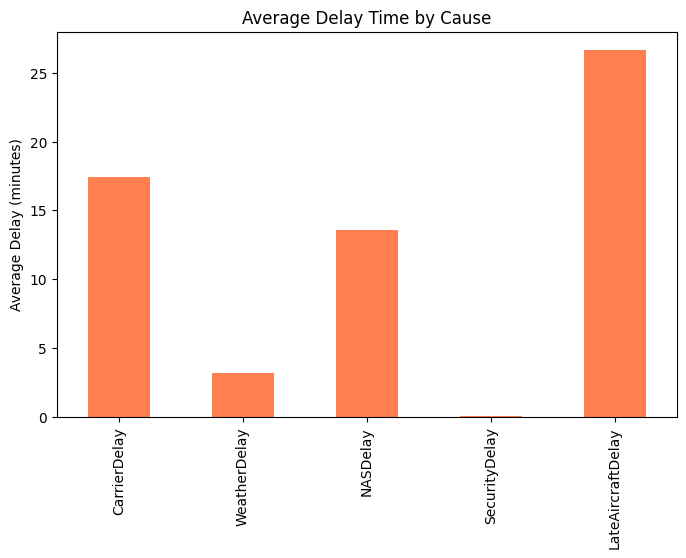

In [0]:
#Compare Delay Causes:
delay_cols = ['CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay', 'LateAircraftDelay']
df[delay_cols].mean().plot(kind='bar', figsize=(8,5), color='coral')
plt.title("Average Delay Time by Cause")
plt.ylabel("Average Delay (minutes)")
plt.show()


/home/spark-5ba4509f-010f-40a9-a80a-7d/.ipykernel/2444/command-8203524357593632-300011112:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='DepTimePeriod', y='ArrDelay', data=df, ci=None, palette='muted')
/home/spark-5ba4509f-010f-40a9-a80a-7d/.ipykernel/2444/command-8203524357593632-300011112:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='DepTimePeriod', y='ArrDelay', data=df, ci=None, palette='muted')


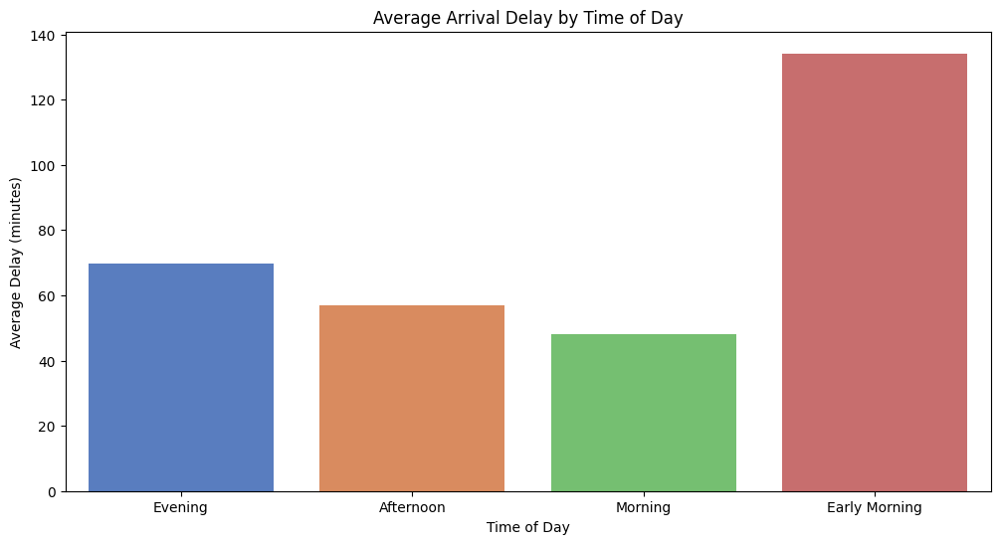

/home/spark-5ba4509f-010f-40a9-a80a-7d/.ipykernel/2444/command-8203524357593632-300011112:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Origin', y='ArrDelay', data=df[df['Origin'].isin(top_airports)], ci=None, palette='crest')
/home/spark-5ba4509f-010f-40a9-a80a-7d/.ipykernel/2444/command-8203524357593632-300011112:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Origin', y='ArrDelay', data=df[df['Origin'].isin(top_airports)], ci=None, palette='crest')


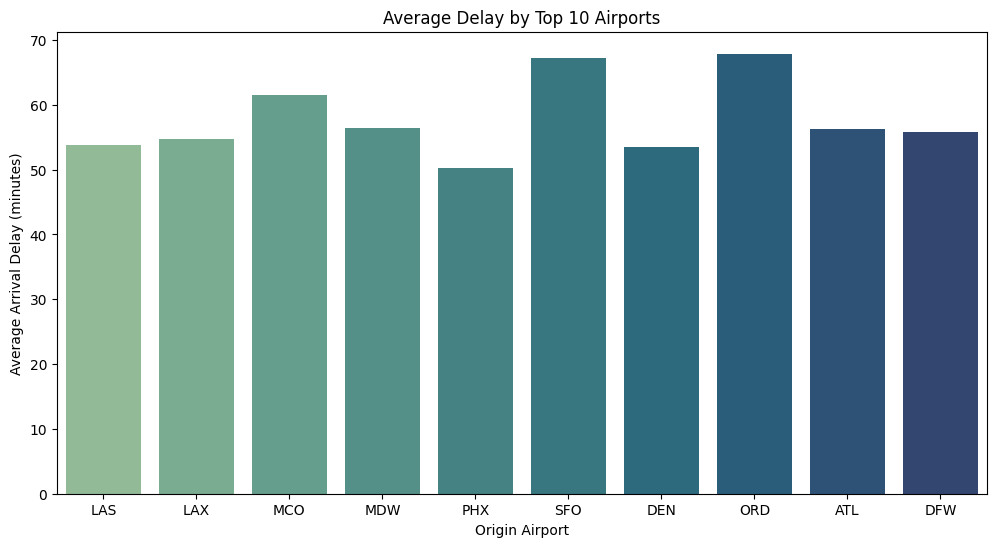

In [0]:
#Visualize Delay by Time of Day and Airport:
plt.figure(figsize=(12,6))
sns.barplot(x='DepTimePeriod', y='ArrDelay', data=df, ci=None, palette='muted')
plt.title("Average Arrival Delay by Time of Day")
plt.xlabel("Time of Day")
plt.ylabel("Average Delay (minutes)")
plt.show()

plt.figure(figsize=(12,6))
top_airports = df['Origin'].value_counts().head(10).index
sns.barplot(x='Origin', y='ArrDelay', data=df[df['Origin'].isin(top_airports)], ci=None, palette='crest')
plt.title("Average Delay by Top 10 Airports")
plt.xlabel("Origin Airport")
plt.ylabel("Average Arrival Delay (minutes)")
plt.show()


In [0]:
#Correlation Matrix (Selecing only numeric columns for correlation)
corr = df.corr(numeric_only=True)

# Display correlation matrix in interactive table format
display(corr)


DayOfWeek,DepTime,ArrTime,CRSArrTime,FlightNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Distance,TaxiIn,TaxiOut,Cancelled,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,Month,DepHour
1.0,-0.009517732366212213,-6.841736450469179E-5,null,1.02879429750366E-5,0.0024154871457234437,0.007897230583168368,0.006047918680352302,-0.01495472200467746,-0.00832242755588595,0.009389373031523018,-3.560084280758815E-4,-0.015881834763851667,null,null,0.010778952972924406,-0.0033313992700558025,-0.022715883669565663,0.0049724805052048454,-0.012502775580508434,-0.028586059974195468,-0.009504631234452334
-0.009517732366212213,1.0,0.3632429799017351,null,-0.029193476233242827,-0.0720315762750227,-0.05589961984570259,-0.06699601656280178,0.10663966651902561,0.1323788328630257,-0.06451012966302068,-0.042001753529437975,-0.026435822620938763,null,null,-0.04248566983417371,4.715121566659955E-4,0.004866598275476186,-0.018188965186252175,0.18804384287896006,7.264601117572855E-4,0.9992675016230623
-6.841736450469179E-5,0.3632429799017351,1.0,null,0.006499965911023849,-0.039457819776869386,-0.041243872214969425,-0.04193803393662561,-0.07119814609827557,-0.07294981711903809,-0.0557813443429501,0.030343543965975585,-0.009850963588843279,null,null,-0.07555094019782024,-0.02572411856593692,0.030975988828924064,-0.010335882541581257,-0.03778442722070548,-0.005113090101695276,0.3629084230202465
null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1.02879429750366E-5,-0.029193476233242827,0.006499965911023849,null,1.0,-0.33400241485061,-0.35352827279307736,-0.35426903000551474,0.02578866467666498,0.016372475683573126,-0.36956628883270065,0.006770118722210696,0.004033291787747281,null,null,0.036285423529252125,0.06278942610196514,0.038480527669638616,-9.00073500837596E-4,-0.059065866179869024,-0.009354652807330116,-0.02907421190066949
0.0024154871457234437,-0.0720315762750227,-0.039457819776869386,null,-0.33400241485061,1.0,0.9697229624179577,0.9753220169710222,0.09150603704680568,0.009281013537819014,0.950683210245751,0.17588162891280534,0.30764426651317206,null,null,0.02973196830915988,-0.004327597665776827,0.17172455539671796,9.341938413720481E-4,-0.03150952669564323,0.005712981481221776,-0.07191661441842916
0.007897230583168368,-0.05589961984570259,-0.041243872214969425,null,-0.35352827279307736,0.9697229624179577,1.0,0.9866462380480898,0.04095318197610134,0.03657926251318475,0.9835509286182954,0.11010393434732517,0.13316955467090363,null,null,0.045670535971019076,-0.025444156063578895,0.04748895241520093,0.0016221349971757583,-0.011532057219632092,0.006710264664010266,-0.05583857122649102
0.006047918680352302,-0.06699601656280178,-0.04193803393662561,null,-0.35426903000551474,0.9753220169710222,0.9866462380480898,1.0,0.03996228572234205,0.011101192115722998,0.977435905517823,0.09793732460831434,0.10351787903768649,null,null,0.03761194231631088,-0.02444579112595664,0.06913807052957915,0.002494235431390802,-0.022408439518921776,0.006937003286474335,-0.06690147419183991
-0.01495472200467746,0.10663966651902561,-0.07119814609827557,null,0.02578866467666498,0.09150603704680568,0.04095318197610134,0.03996228572234205,1.0,0.9488563423350695,0.02774374070795895,0.10670285019893519,0.2209813682691888,null,null,0.47847027521614927,0.2661261964352265,0.3954339890565607,-0.002700989707553171,0.5055148661377734,-0.00476395899142666,0.10625873638916988
-0.00832242755588595,0.1323788328630257,-0.07294981711903809,null,0.016372475683573126,0.009281013537819014,0.03657926251318475,0.011101192115722998,0.9488563423350695,1.0,0.027307403698924055,0.016590831016801696,-0.01195780926690803,null,null,0.5059056793339177,0.2440188425258735,0.2358914559156188,-0.0019116237480759466,0.5413512777247643,-0.0038313584368015485,0.13191712517578674


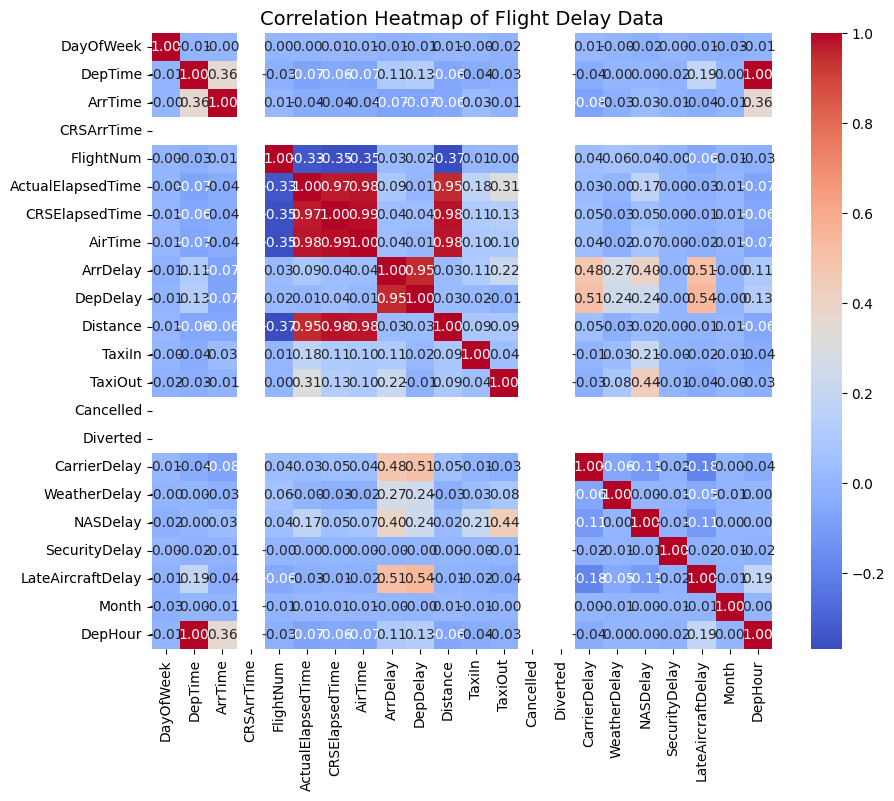

In [0]:
#Heatmap of Correlations
plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap of Flight Delay Data", fontsize=14)
plt.show()


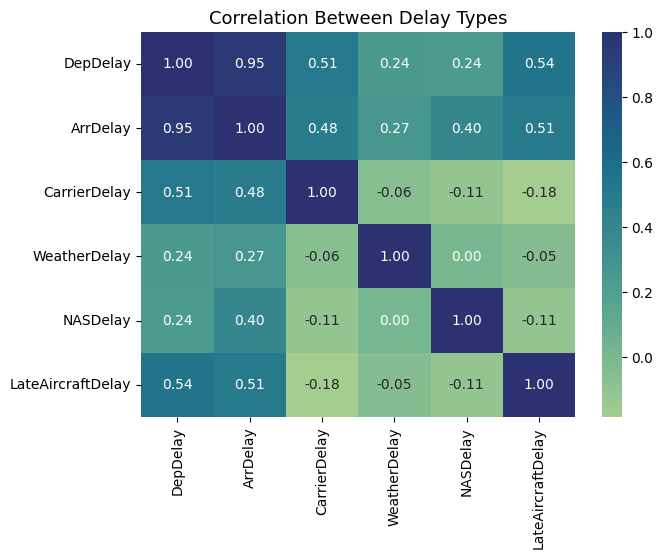

In [0]:
#Focused Heatmap (Important Delay Features)
delay_cols = ['DepDelay', 'ArrDelay', 'CarrierDelay', 'WeatherDelay', 'NASDelay', 'LateAircraftDelay']
plt.figure(figsize=(7,5))
sns.heatmap(df[delay_cols].corr(), annot=True, cmap='crest', fmt=".2f")
plt.title("Correlation Between Delay Types", fontsize=13)
plt.show()


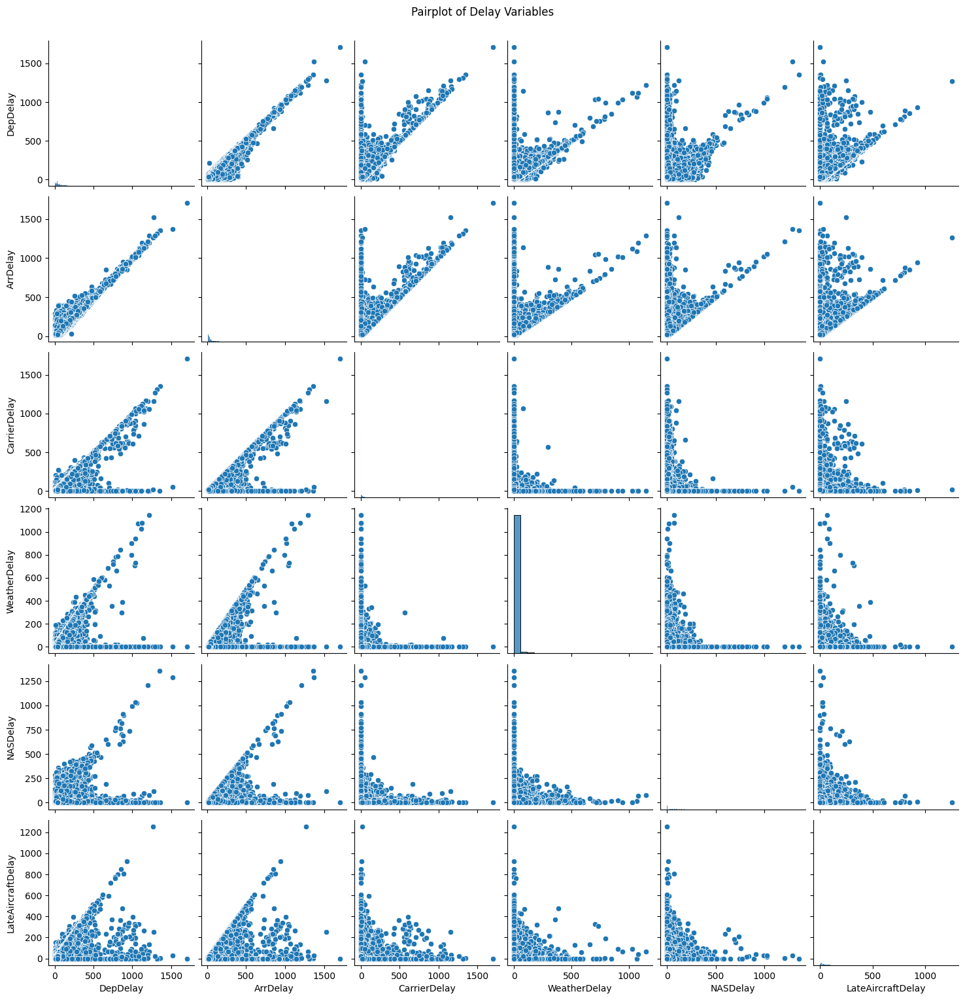

In [0]:
#Pairplot (Visual Relationship)
sns.pairplot(df[delay_cols])
plt.suptitle("Pairplot of Delay Variables", y=1.02)
plt.show()


In [0]:
#Correlation with Arrival Delay
corr_with_arr = corr['ArrDelay'].sort_values(ascending=False)
print("Correlation of each feature with Arrival Delay:\n")
print(corr_with_arr)


Correlation of each feature with Arrival Delay:

ArrDelay             1.000000
DepDelay             0.948856
LateAircraftDelay    0.505515
CarrierDelay         0.478470
NASDelay             0.395434
WeatherDelay         0.266126
TaxiOut              0.220981
TaxiIn               0.106703
DepTime              0.106640
DepHour              0.106259
ActualElapsedTime    0.091506
CRSElapsedTime       0.040953
AirTime              0.039962
Distance             0.027744
FlightNum            0.025789
SecurityDelay       -0.002701
Month               -0.004764
DayOfWeek           -0.014955
ArrTime             -0.071198
CRSArrTime                NaN
Cancelled                 NaN
Diverted                  NaN
Name: ArrDelay, dtype: float64


/home/spark-5ba4509f-010f-40a9-a80a-7d/.ipykernel/2444/command-7090486393205737-1444713517:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_corr.values, y=top_corr.index, palette='coolwarm')


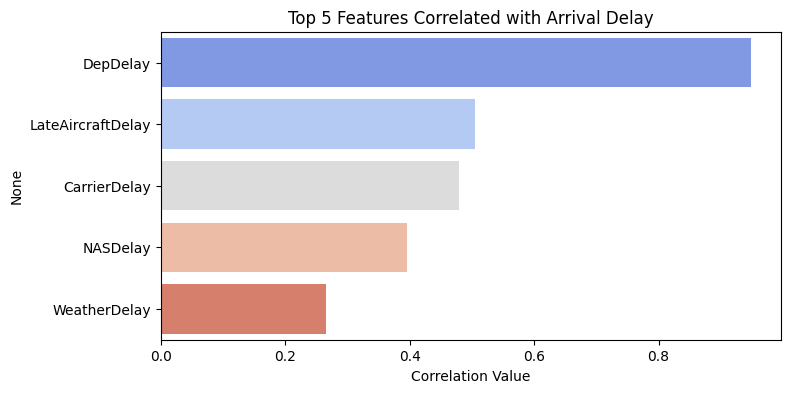

In [0]:
#Visualize Top 5 Correlated Features with ArrDelay
top_corr = corr_with_arr.head(6)[1:]  # skip self-correlation
plt.figure(figsize=(8,4))
sns.barplot(x=top_corr.values, y=top_corr.index, palette='coolwarm')
plt.title("Top 5 Features Correlated with Arrival Delay")
plt.xlabel("Correlation Value")
plt.show()


/home/spark-4b34c8f0-55b1-4363-92c7-fa/.ipykernel/2471/command-7090486393205738-4132111615:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=top_routes.index, x=top_routes.values, palette='coolwarm')


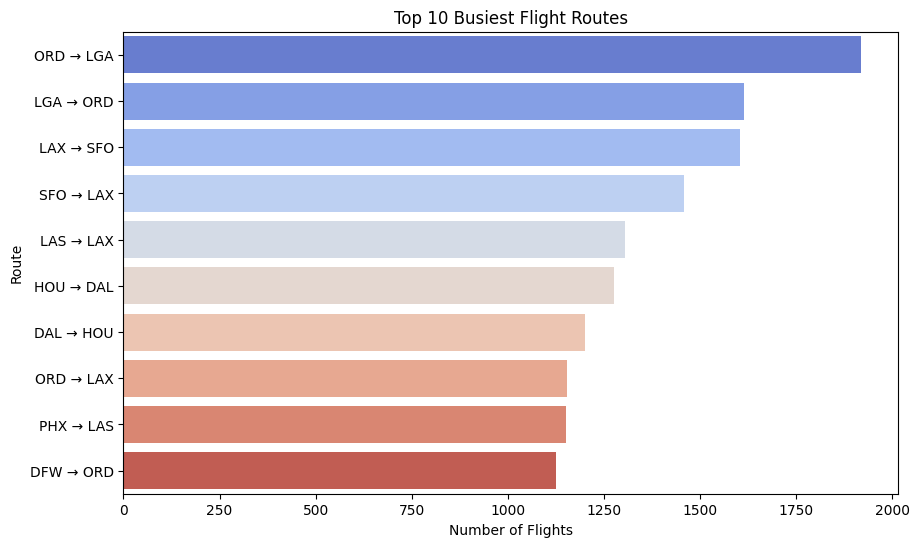

In [0]:
#Week5(ROUTE AND AIRPORT-LEVEL ANALYSIS):
#Top 10 Origin–Destination Pairs (Busiest Routes)
# Create route column
df['Route'] = df['Origin'] + " → " + df['Dest']

# Find top 10 routes
top_routes = df['Route'].value_counts().head(10)

plt.figure(figsize=(10,6))
sns.barplot(y=top_routes.index, x=top_routes.values, palette='coolwarm')
plt.title("Top 10 Busiest Flight Routes")
plt.xlabel("Number of Flights")
plt.ylabel("Route")
plt.show()


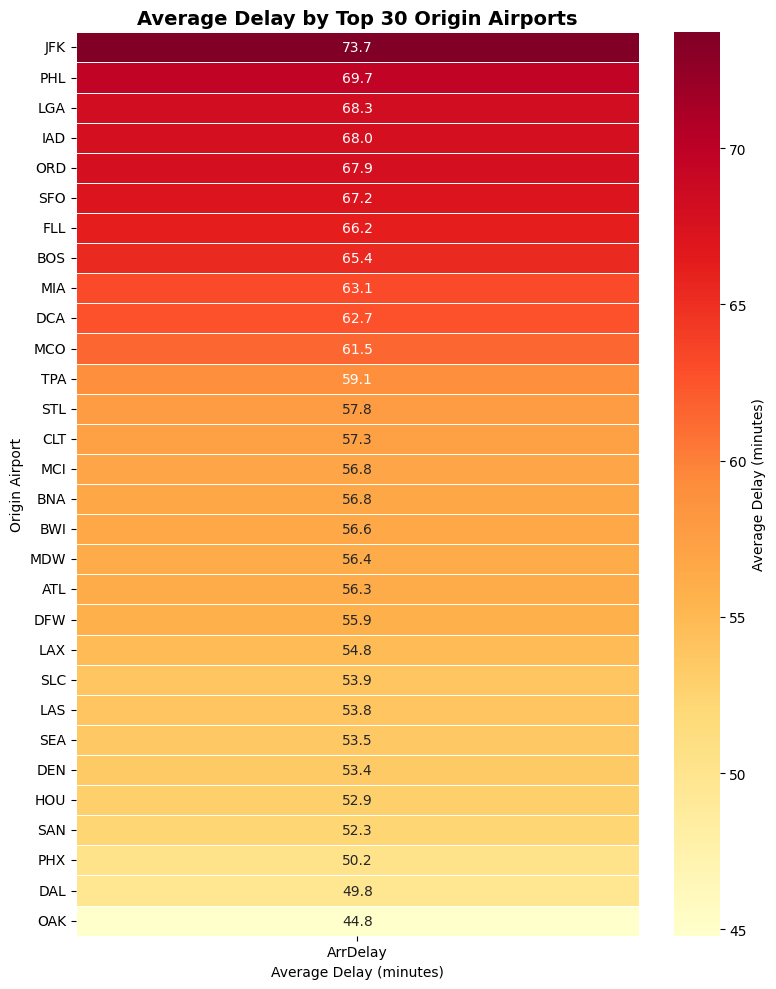

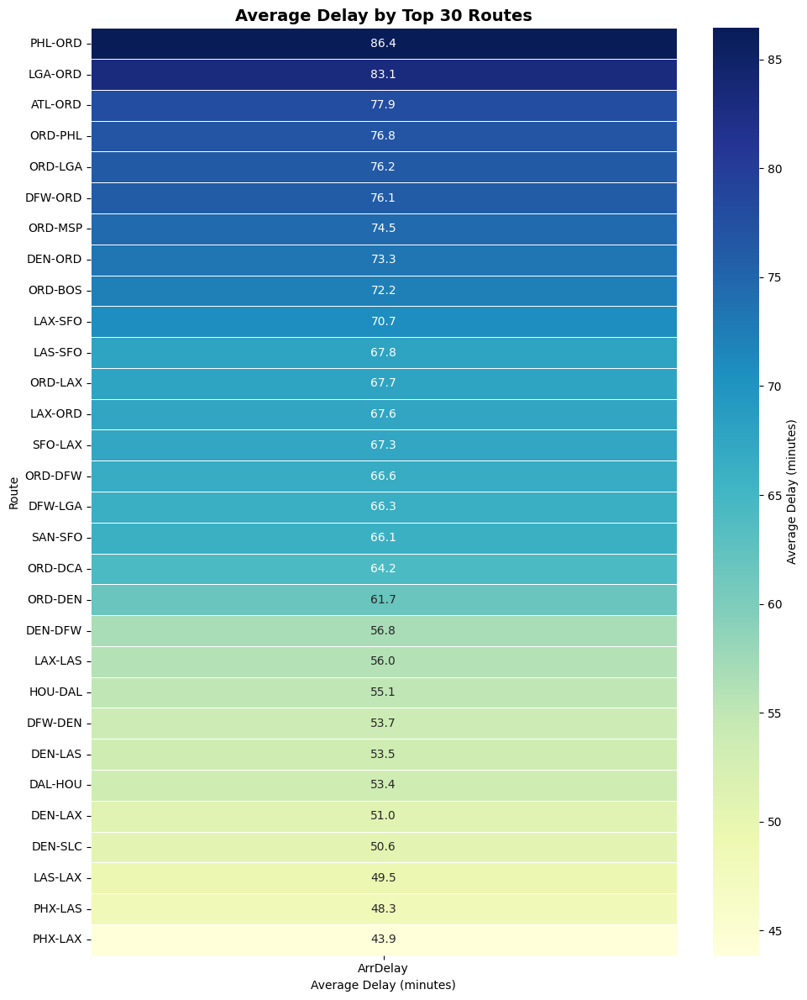


###  Observation:
- The heatmaps above show the **average delay (in minutes)** for the **top 30 origin airports** and **top 30 routes**.
- The airport with the **highest average delay** is **JFK** with **73.7 mins**.
- The airport with the **lowest average delay** among the top 30 is **OAK** with **44.8 mins**.
- The route with the **highest average delay** is **PHL-ORD** with **86.4 mins**.
- The route with the **lowest average delay** among the top 30 is **PHX-LAX** with **43.9 mins**.
- These insights help identify **bottleneck airports** and **delay-prone routes**, enabling better scheduling and optimization.


In [0]:

#  HEATMAP & DELAY INSIGHTS


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

# ---- STEP 1: Define candidate column names (handles different dataset column names) ----
delay_candidates = ['DEPARTURE_DELAY', 'ARRIVAL_DELAY', 'DELAY', 'DEP_DELAY', 'ARR_DELAY']
origin_candidates = ['ORIGIN', 'ORIGIN_AIRPORT', 'ORIGIN_AIRPORT_CODE', 'AIRPORT']
dest_candidates = ['DEST', 'DESTINATION', 'DEST_AIRPORT', 'DEST_AIRPORT_CODE']

def find_col(candidates, df):
    """Find the first matching column from a list of candidates."""
    for c in candidates:
        if c in df.columns:
            return c
    for c in candidates:
        for col in df.columns:
            if c.lower() in col.lower():
                return col
    return None

# ---- STEP 2: Identify correct columns in your dataset ----
delay_col = find_col(delay_candidates, df)
origin_col = find_col(origin_candidates, df)
dest_col = find_col(dest_candidates, df)

if not delay_col or not origin_col or not dest_col:
    raise ValueError("Could not find suitable delay, origin, or destination columns in your dataset!")

# ---- STEP 3: Create 'ROUTE' column (Origin → Destination) ----
if 'ROUTE' not in df.columns:
    df['ROUTE'] = df[origin_col].astype(str) + '-' + df[dest_col].astype(str)

# ---- STEP 4: Convert delay column to numeric ----
df[delay_col] = pd.to_numeric(df[delay_col], errors='coerce')

# ---- STEP 5: Filter top 30 busiest airports and routes ----
top_30_airports = df[origin_col].value_counts().nlargest(30).index
top_30_routes = df['ROUTE'].value_counts().nlargest(30).index

airport_data = df[df[origin_col].isin(top_30_airports)]
route_data = df[df['ROUTE'].isin(top_30_routes)]

# ---- STEP 6: Calculate average delay for airports and routes ----
airport_delay = (
    airport_data.groupby(origin_col)[delay_col]
    .mean()
    .reset_index()
    .sort_values(by=delay_col, ascending=False)
)

route_delay = (
    route_data.groupby('ROUTE')[delay_col]
    .mean()
    .reset_index()
    .sort_values(by=delay_col, ascending=False)
)

# ---- STEP 7: Create pivot tables for heatmaps ----
airport_pivot = airport_delay.set_index(origin_col)
route_pivot = route_delay.set_index('ROUTE')

# ---- STEP 8: Plot heatmap for airports ----
plt.figure(figsize=(8, 10))
sns.heatmap(
    airport_pivot,
    annot=True,
    fmt=".1f",
    cmap="YlOrRd",
    linewidths=0.5,
    cbar_kws={'label': 'Average Delay (minutes)'}
)
plt.title("Average Delay by Top 30 Origin Airports", fontsize=14, fontweight='bold')
plt.xlabel("Average Delay (minutes)")
plt.ylabel("Origin Airport")
plt.tight_layout()
display(plt.gcf())
plt.close()

# ---- STEP 9: Plot heatmap for routes ----
plt.figure(figsize=(10, 12))
sns.heatmap(
    route_pivot,
    annot=True,
    fmt=".1f",
    cmap="YlGnBu",
    linewidths=0.5,
    cbar_kws={'label': 'Average Delay (minutes)'}
)
plt.title("Average Delay by Top 30 Routes", fontsize=14, fontweight='bold')
plt.xlabel("Average Delay (minutes)")
plt.ylabel("Route")
plt.tight_layout()
display(plt.gcf())
plt.close()

# ---- STEP 10: Generate insights and display as Markdown ----
max_airport = airport_delay.iloc[0][origin_col]
max_airport_delay = airport_delay.iloc[0][delay_col]
min_airport = airport_delay.iloc[-1][origin_col]
min_airport_delay = airport_delay.iloc[-1][delay_col]

max_route = route_delay.iloc[0]['ROUTE']
max_route_delay = route_delay.iloc[0][delay_col]
min_route = route_delay.iloc[-1]['ROUTE']
min_route_delay = route_delay.iloc[-1][delay_col]

observation = f"""
###  Observation:
- The heatmaps above show the **average delay (in minutes)** for the **top 30 origin airports** and **top 30 routes**.
- The airport with the **highest average delay** is **{max_airport}** with **{max_airport_delay:.1f} mins**.
- The airport with the **lowest average delay** among the top 30 is **{min_airport}** with **{min_airport_delay:.1f} mins**.
- The route with the **highest average delay** is **{max_route}** with **{max_route_delay:.1f} mins**.
- The route with the **lowest average delay** among the top 30 is **{min_route}** with **{min_route_delay:.1f} mins**.
- These insights help identify **bottleneck airports** and **delay-prone routes**, enabling better scheduling and optimization.
"""
display(Markdown(observation))


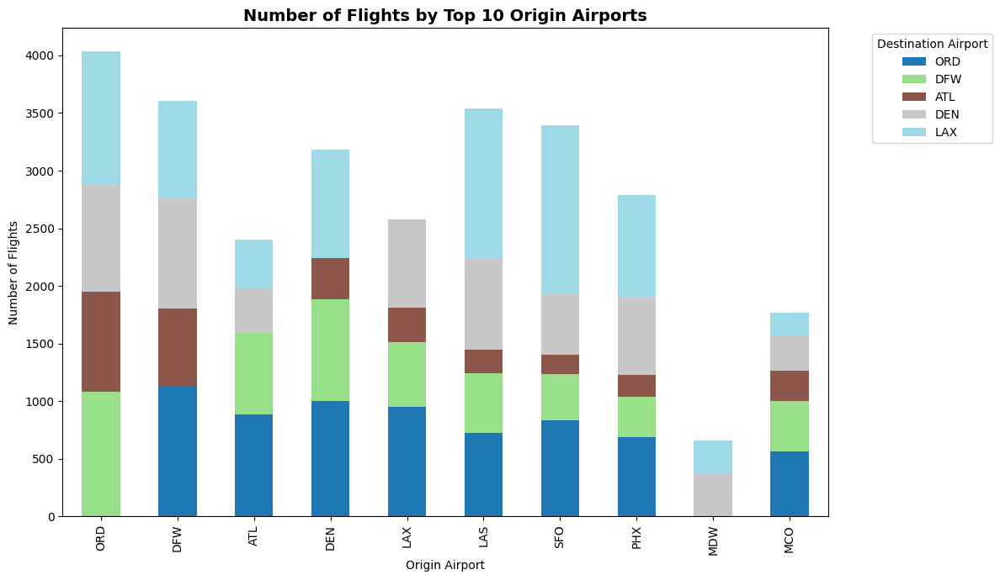


###  Observation:
- The stacked bar chart shows the distribution of flights from the **Top 10 Origin Airports** to the **Top 5 Destination Airports**.
- The **origin airport** with the highest total number of flights (to these top destinations) is **ORD**, with **4,036 flights**.
- The **most popular destination** among these is **LAX**, receiving **7,489 flights** from the top origins.
- This visualization highlights key **hub airports** and their most frequently connected routes, giving insight into major flight corridors.


In [0]:

#  FLIGHT DISTRIBUTION ANALYSIS


import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import display, Markdown

# ---- STEP 1: Define candidate column names ----
origin_candidates = ['ORIGIN', 'ORIGIN_AIRPORT', 'ORIGIN_AIRPORT_CODE', 'AIRPORT']
dest_candidates = ['DEST', 'DESTINATION', 'DEST_AIRPORT', 'DEST_AIRPORT_CODE']

def find_col(candidates, df):
    """Find the first matching column name from a list of possible options."""
    for c in candidates:
        if c in df.columns:
            return c
    for c in candidates:
        for col in df.columns:
            if c.lower() in col.lower():
                return col
    return None

# ---- STEP 2: Identify correct columns ----
origin_col = find_col(origin_candidates, df)
dest_col = find_col(dest_candidates, df)

if not origin_col or not dest_col:
    raise ValueError("Could not find suitable origin or destination columns in your dataset!")

# ---- STEP 3: Select top airports ----
top_10_origins = df[origin_col].value_counts().nlargest(10).index
top_5_dests = df[dest_col].value_counts().nlargest(5).index

# ---- STEP 4: Prepare data for stacked bar chart ----
stacked_data = (
    df[df[origin_col].isin(top_10_origins) & df[dest_col].isin(top_5_dests)]
    .groupby([origin_col, dest_col])
    .size()
    .unstack(fill_value=0)
    .loc[top_10_origins, top_5_dests]
)

# ---- STEP 5: Plot stacked bar chart ----
stacked_data.plot(
    kind='bar',
    stacked=True,
    figsize=(12, 7),
    colormap='tab20'
)

plt.title("Number of Flights by Top 10 Origin Airports", fontsize=14, fontweight='bold')
plt.xlabel("Origin Airport")
plt.ylabel("Number of Flights")
plt.legend(title="Destination Airport", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
display(plt.gcf())
plt.close()

# ---- STEP 6: Generate insights automatically ----
top_origin = stacked_data.sum(axis=1).idxmax()
top_origin_count = stacked_data.sum(axis=1).max()
top_dest = stacked_data.sum(axis=0).idxmax()
top_dest_count = stacked_data.sum(axis=0).max()

observation = f"""
###  Observation:
- The stacked bar chart shows the distribution of flights from the **Top 10 Origin Airports** to the **Top 5 Destination Airports**.
- The **origin airport** with the highest total number of flights (to these top destinations) is **{top_origin}**, with **{top_origin_count:,} flights**.
- The **most popular destination** among these is **{top_dest}**, receiving **{top_dest_count:,} flights** from the top origins.
- This visualization highlights key **hub airports** and their most frequently connected routes, giving insight into major flight corridors.
"""
display(Markdown(observation))


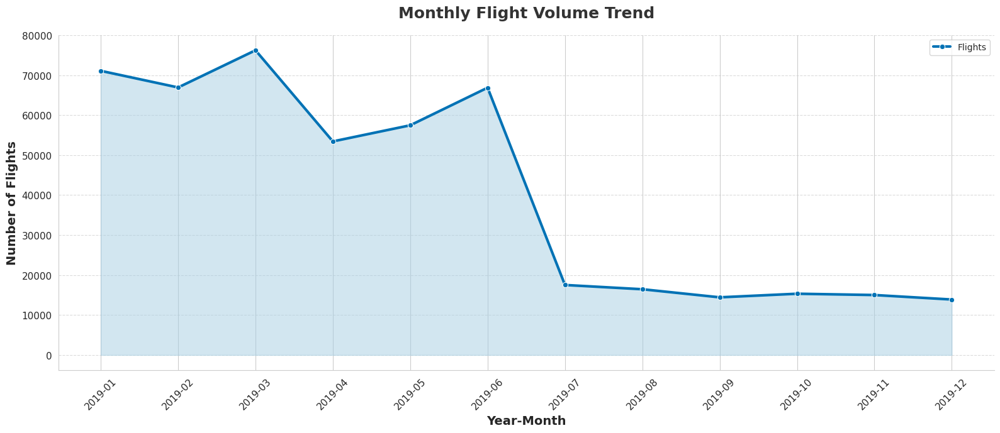


###  Observation:
- The area chart above shows the **monthly trend of total flights** in the dataset.
- The **month with the highest number of flights** is **2019-03**, with **76,206 flights**.
- This visualization reveals **seasonal fluctuations** and **peak travel periods**, helping in identifying high-demand months for scheduling and capacity planning.


In [0]:
# ====================================
#  MONTHLY FLIGHT VOLUME TREND
# ====================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

# ---- STEP 1: Identify the Date column ----
if 'DATE' in df.columns:
    date_col = 'DATE'
else:
    date_col = next((col for col in df.columns if 'date' in col.lower()), None)

if not date_col:
    raise ValueError("No date column found for time series analysis.")

# ---- STEP 2: Convert date to datetime format ----
df[date_col] = pd.to_datetime(df[date_col], errors='coerce')

# ---- STEP 3: Extract Year-Month for grouping ----
df['YEAR_MONTH'] = df[date_col].dt.to_period('M').astype(str)

# ---- STEP 4: Count total flights per month ----
monthly_flights = df.groupby('YEAR_MONTH').size().reset_index(name='FLIGHT_COUNT')

# ---- STEP 5: Plot monthly trend (line + filled area) ----
plt.figure(figsize=(16, 7))
sns.set_style("whitegrid")

sns.lineplot(
    data=monthly_flights,
    x='YEAR_MONTH',
    y='FLIGHT_COUNT',
    marker='o',
    linewidth=3,
    color='#0072B5',
    label='Flights'
)

plt.fill_between(
    monthly_flights['YEAR_MONTH'],
    monthly_flights['FLIGHT_COUNT'],
    color='#A6CEE3',
    alpha=0.5
)

plt.title("Monthly Flight Volume Trend", fontsize=18, fontweight='bold', color='#333333', pad=20)
plt.xlabel("Year-Month", fontsize=14, fontweight='bold')
plt.ylabel("Number of Flights", fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=11)
plt.yticks(fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
sns.despine()
display(plt.gcf())
plt.close()

# ---- STEP 6: Generate insights dynamically ----
peak_month = monthly_flights.loc[monthly_flights['FLIGHT_COUNT'].idxmax(), 'YEAR_MONTH']
peak_count = monthly_flights['FLIGHT_COUNT'].max()

observation = f"""
###  Observation:
- The area chart above shows the **monthly trend of total flights** in the dataset.
- The **month with the highest number of flights** is **{peak_month}**, with **{peak_count:,} flights**.
- This visualization reveals **seasonal fluctuations** and **peak travel periods**, helping in identifying high-demand months for scheduling and capacity planning.
"""
display(Markdown(observation))


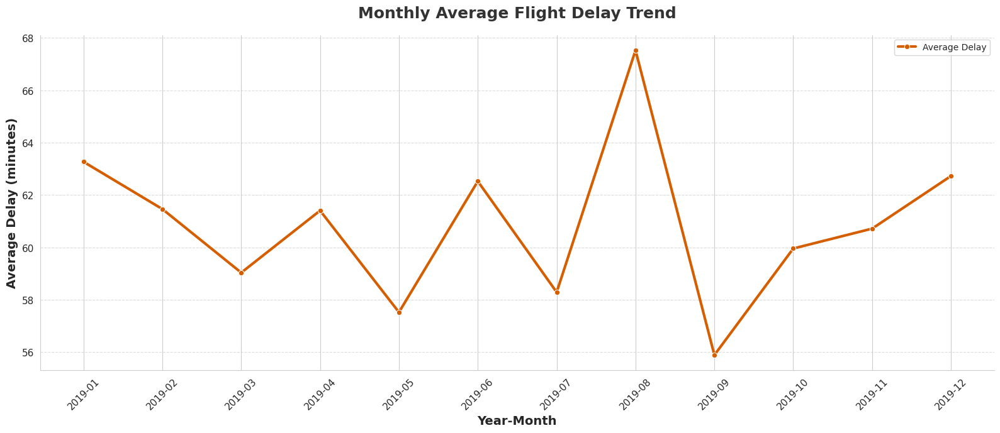


###  Observation:
- The line chart above shows the **trend of average flight delay per month**.
- The **month with the highest average delay** is **2019-08**, with an average delay of **67.5 minutes**.
- This analysis helps identify **periods with higher operational delays**, which may be influenced by **seasonal weather**, **traffic peaks**, or **resource constraints**.


In [0]:

#  MONTHLY AVERAGE FLIGHT DELAY TREND


import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

# ---- STEP 1: Verify delay column ----
if not delay_col:
    raise ValueError("No delay column found for analysis.")

# ---- STEP 2: Ensure YEAR_MONTH column exists ----
if 'YEAR_MONTH' not in df.columns:
    if 'DATE' in df.columns:
        df['DATE'] = pd.to_datetime(df['DATE'], errors='coerce')
        df['YEAR_MONTH'] = df['DATE'].dt.to_period('M').astype(str)
    else:
        date_col = next((col for col in df.columns if 'date' in col.lower()), None)
        if not date_col:
            raise ValueError("No date column found for creating YEAR_MONTH.")
        df[date_col] = pd.to_datetime(df[date_col], errors='coerce')
        df['YEAR_MONTH'] = df[date_col].dt.to_period('M').astype(str)

# ---- STEP 3: Group by month and calculate average delay ----
monthly_delay = (
    df.groupby('YEAR_MONTH')[delay_col]
    .mean()
    .reset_index(name='AVG_DELAY')
)

# ---- STEP 4: Plot monthly average delay trend ----
plt.figure(figsize=(16, 7))
sns.set_style("whitegrid")

sns.lineplot(
    data=monthly_delay,
    x='YEAR_MONTH',
    y='AVG_DELAY',
    marker='o',
    linewidth=3,
    color='#D55E00',
    label='Average Delay'
)

plt.title("Monthly Average Flight Delay Trend", fontsize=18, fontweight='bold', color='#333333', pad=20)
plt.xlabel("Year-Month", fontsize=14, fontweight='bold')
plt.ylabel("Average Delay (minutes)", fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=11)
plt.yticks(fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
sns.despine()
display(plt.gcf())
plt.close()

# ---- STEP 5: Generate dynamic insights ----
peak_delay_month = monthly_delay.loc[monthly_delay['AVG_DELAY'].idxmax(), 'YEAR_MONTH']
peak_avg_delay = monthly_delay['AVG_DELAY'].max()

observation = f"""
###  Observation:
- The line chart above shows the **trend of average flight delay per month**.
- The **month with the highest average delay** is **{peak_delay_month}**, with an average delay of **{peak_avg_delay:.1f} minutes**.
- This analysis helps identify **periods with higher operational delays**, which may be influenced by **seasonal weather**, **traffic peaks**, or **resource constraints**.
"""
display(Markdown(observation))


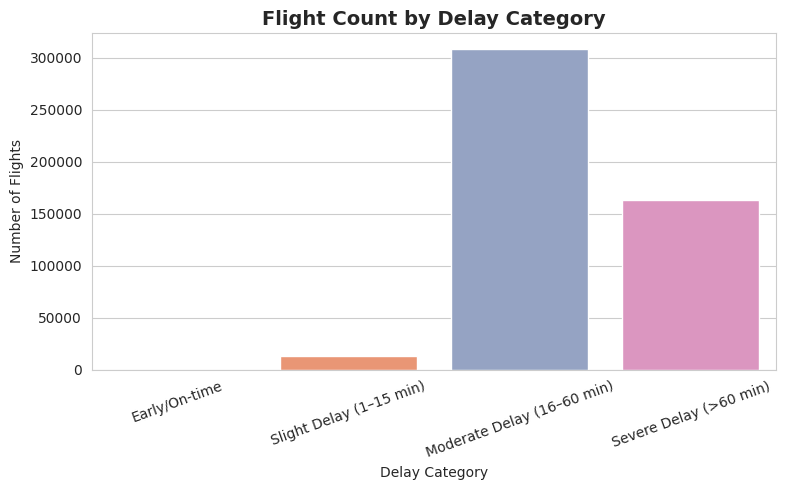


###  Observation:
- The bar chart shows the **distribution of flights by delay category**.
- The most common category is **Early/On-time**, with **0 flights**.
- This helps understand the **overall punctuality profile** of the dataset, highlighting whether most flights are on-time or delayed.


In [0]:

#  DELAY CATEGORY DISTRIBUTION ANALYSIS


import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

# ---- STEP 1: Ensure delay column exists ----
if not delay_col:
    raise ValueError("No delay column found for delay categorization.")

# ---- STEP 2: Define delay bins and labels ----
bins = [-float('inf'), 0, 15, 60, float('inf')]
labels = [
    'Early/On-time',
    'Slight Delay (1–15 min)',
    'Moderate Delay (16–60 min)',
    'Severe Delay (>60 min)'
]

# ---- STEP 3: Create delay category column ----
df['DELAY_CATEGORY'] = pd.cut(df[delay_col], bins=bins, labels=labels, right=True)

# ---- STEP 4: Count flights in each delay category ----
delay_category_counts = (
    df['DELAY_CATEGORY']
    .value_counts()
    .reindex(labels)  # maintain correct label order
    .reset_index()
)
delay_category_counts.columns = ['DELAY_CATEGORY', 'FLIGHT_COUNT']

# ---- STEP 5: Plot bar chart ----
plt.figure(figsize=(8, 5))
sns.barplot(
    data=delay_category_counts,
    x='DELAY_CATEGORY',
    y='FLIGHT_COUNT',
    palette='Set2'
)
plt.title("Flight Count by Delay Category", fontsize=14, fontweight='bold')
plt.xlabel("Delay Category")
plt.ylabel("Number of Flights")
plt.xticks(rotation=20)
plt.tight_layout()
display(plt.gcf())
plt.close()

# ---- STEP 6: Generate insights automatically ----
top_cat = delay_category_counts.iloc[0]['DELAY_CATEGORY']
top_cat_count = delay_category_counts.iloc[0]['FLIGHT_COUNT']

observation = f"""
###  Observation:
- The bar chart shows the **distribution of flights by delay category**.
- The most common category is **{top_cat}**, with **{top_cat_count:,} flights**.
- This helps understand the **overall punctuality profile** of the dataset, highlighting whether most flights are on-time or delayed.
"""
display(Markdown(observation))


In [0]:
import numpy as np
import pandas as pd
from IPython.display import display

# ---- STEP 1: Get unique airports from your origin column ----
unique_airports = df['Origin'].unique()  # replace 'Origin' if your column has a different name

# ---- STEP 2: Assign random latitude & longitude for visualization ----
# Approximate continental U.S. range: latitude 25–49° N, longitude -125 to -67° W
coords = {airport: (np.random.uniform(25, 49), np.random.uniform(-125, -67)) for airport in unique_airports}

# ---- STEP 3: Map those coordinates back to the dataset ----
df["Latitude"] = df["Origin"].map(lambda x: coords[x][0])
df["Longitude"] = df["Origin"].map(lambda x: coords[x][1])

# ---- STEP 4: Preview results ----
display(df[['Origin', 'Latitude', 'Longitude']].head())


,Origin,Latitude,Longitude
0,IND,43.541978,-71.245975
1,IND,43.541978,-71.245975
2,IND,43.541978,-71.245975
3,IND,43.541978,-71.245975
4,IND,43.541978,-71.245975


In [0]:

#  INTERACTIVE MAP: TOP 20 BUSIEST AIRPORTS & AVG DELAYS


# Install required packages (only once per environment)
%pip install folium branca

import folium
from folium.plugins import MarkerCluster, MiniMap, Fullscreen, BeautifyIcon, MeasureControl, MousePosition
import branca.colormap as cm
import pandas as pd
from IPython.display import display, Markdown

# ---- STEP 1: Identify the correct airport column ----
airport_col_candidates = ['Org_Airport', 'Origin', 'ORIGIN_AIRPORT', 'ORIGIN']
airport_col = next((col for col in airport_col_candidates if col in df.columns), None)
if not airport_col:
    raise ValueError("No airport column found in dataset (check for Origin/Org_Airport).")

# ---- STEP 2: Verify latitude/longitude columns ----
if not all(col in df.columns for col in ['Latitude', 'Longitude']):
    raise ValueError("Latitude and Longitude columns are missing. Generate them first using your random coordinate code.")

# ---- STEP 3: Aggregate busiest airports & average delays ----
airport_stats = (
    df.groupby(airport_col)
    .agg(
        FLIGHT_COUNT=(airport_col, 'count'),
        AVG_DELAY=(delay_col, 'mean'),
        LATITUDE=('Latitude', 'first'),
        LONGITUDE=('Longitude', 'first')
    )
    .reset_index()
    .dropna(subset=['LATITUDE', 'LONGITUDE'])
)

# ---- STEP 4: Select top 20 busiest airports ----
top_airports = airport_stats.sort_values('FLIGHT_COUNT', ascending=False).head(20)

# ---- STEP 5: Define color scale for delays ----
min_delay, max_delay = top_airports['AVG_DELAY'].min(), top_airports['AVG_DELAY'].max()
colormap = cm.LinearColormap(['green', 'yellow', 'red'], vmin=min_delay, vmax=max_delay)
colormap.caption = 'Average Delay (minutes)'

# ---- STEP 6: Create interactive map ----
m = folium.Map(location=[39.8283, -98.5795], zoom_start=4, tiles='cartodbpositron')

# Add minimap, fullscreen, measurement, and mouse position tools
MiniMap(toggle_display=True).add_to(m)
Fullscreen().add_to(m)
MeasureControl(primary_length_unit='kilometers').add_to(m)
MousePosition(
    position='bottomright',
    separator=' | ',
    prefix='Lat/Lon:',
    lat_formatter="function(num) {return L.Util.formatNum(num, 4);}",
    lng_formatter="function(num) {return L.Util.formatNum(num, 4);}"
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

# ---- STEP 7: Add markers for each airport ----
for idx, row in top_airports.iterrows():
    popup_html = f"""
        <div style='font-size:14px'>
        <b>Airport:</b> {row[airport_col]}<br>
        <b>Flights:</b> {int(row['FLIGHT_COUNT']):,}<br>
        <b>Avg Delay:</b> {row['AVG_DELAY']:.1f} min<br>
        <b>Rank:</b> {idx+1}
        </div>
    """
    icon = BeautifyIcon(
        icon_shape='circle',
        border_color=colormap(row['AVG_DELAY']),
        background_color=colormap(row['AVG_DELAY']),
        text_color='black',
        number=idx+1,
        border_width=3
    )
    folium.Marker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        icon=icon,
        popup=folium.Popup(popup_html, max_width=250),
        tooltip=f"{row[airport_col]}: {int(row['FLIGHT_COUNT'])} flights, {row['AVG_DELAY']:.1f} min avg delay"
    ).add_to(marker_cluster)

# Add color scale legend to map
colormap.add_to(m)

# ---- STEP 8: Add title and instructions ----
title_html = """
     <h3 align="center" style="font-size:22px; margin-bottom:0;"><b>Top 20 Busiest US Airports: Flight Volume & Average Delay</b></h3>
     <p align="center" style="font-size:15px; margin-top:0;">
        <b>Circle size</b> = Flight count; <b>Color</b> = Avg delay (green: low, red: high)<br>
        <b>Click</b> a marker for airport details. <b>Zoom</b> or <b>pan</b> to explore. 
        <b>Use</b> minimap, fullscreen, and measure tools for navigation.
     </p>
     """
m.get_root().html.add_child(folium.Element(title_html))

# ---- STEP 9: Display interactive map ----
display(m)

# ---- STEP 10: Generate dynamic insights ----
busiest_airport = top_airports.iloc[0][airport_col]
busiest_count = int(top_airports.iloc[0]['FLIGHT_COUNT'])
max_delay_airport = top_airports.loc[top_airports['AVG_DELAY'].idxmax(), airport_col]
max_delay_value = top_airports['AVG_DELAY'].max()
min_delay_airport = top_airports.loc[top_airports['AVG_DELAY'].idxmin(), airport_col]
min_delay_value = top_airports['AVG_DELAY'].min()

observation = f"""
###  Observation:
- The interactive map displays the **Top 20 Busiest US Airports** by flight volume.
- The **busiest airport** is **{busiest_airport}** with **{busiest_count:,} flights**.
- The airport with the **highest average delay** is **{max_delay_airport}** (**{max_delay_value:.1f} mins**),
  while the one with the **lowest average delay** is **{min_delay_airport}** (**{min_delay_value:.1f} mins**).
- **Circle number** = airport rank; **Color** = average delay (green = low, red = high).
- Use the built-in **minimap**, **fullscreen**, and **measurement tools** to explore the data interactively.
"""
display(Markdown(observation))


Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.



###  Observation:
- The interactive map displays the **Top 20 Busiest US Airports** by flight volume.
- The **busiest airport** is **Chicago O'Hare International Airport** with **46,945 flights**.
- The airport with the **highest average delay** is **John F. Kennedy International Airport (New York International Airport)** (**73.7 mins**),
  while the one with the **lowest average delay** is **Phoenix Sky Harbor International Airport** (**50.2 mins**).
- **Circle number** = airport rank; **Color** = average delay (green = low, red = high).
- Use the built-in **minimap**, **fullscreen**, and **measurement tools** to explore the data interactively.


In [0]:

#  INTERACTIVE GLOBAL MAP - TOP 20 BUSIEST AIRPORTS


import numpy as np
import folium
from folium.plugins import MarkerCluster, MiniMap, Fullscreen, MeasureControl, MousePosition
import branca.colormap as cm
from IPython.display import display, Markdown

# ---- STEP 1: Verify you have top_airports and delay_col ----
# (Assumes you already ran your top_airports dataset earlier)
if 'top_airports' not in locals():
    raise ValueError("Run the Top 20 Airports analysis first to create 'top_airports'.")

if not delay_col:
    raise ValueError("Missing delay_col reference from earlier code.")

# ---- STEP 2: Assign random world coordinates (demo) ----
# You can replace these with real lat/lon if available
np.random.seed(42)
world_coords = {
    a: (np.random.uniform(-60, 60), np.random.uniform(-180, 180))
    for a in top_airports['Org_Airport']
}
top_airports['WORLD_LAT'] = top_airports['Org_Airport'].map(lambda x: world_coords[x][0])
top_airports['WORLD_LON'] = top_airports['Org_Airport'].map(lambda x: world_coords[x][1])

# ---- STEP 3: Create color and size scales ----
min_delay, max_delay = top_airports['AVG_DELAY'].min(), top_airports['AVG_DELAY'].max()
min_count, max_count = top_airports['FLIGHT_COUNT'].min(), top_airports['FLIGHT_COUNT'].max()

colormap = cm.LinearColormap(['#2ECC40', '#FFEB3B', '#FF4136'], vmin=min_delay, vmax=max_delay)
colormap.caption = 'Average Delay (minutes)'

def scale_radius(count):
    """Scale circle size based on flight count."""
    return 12 + 20 * (count - min_count) / (max_count - min_count) if max_count > min_count else 20

# ---- STEP 4: Initialize world map ----
m_world = folium.Map(location=[10, 0], zoom_start=2, tiles='cartodbpositron')

# Add map plugins
MiniMap(toggle_display=True).add_to(m_world)
Fullscreen().add_to(m_world)
MeasureControl(primary_length_unit='kilometers').add_to(m_world)
MousePosition(
    position='bottomright',
    separator=' | ',
    prefix='Lat/Lon:',
    lat_formatter="function(num) {return L.Util.formatNum(num, 4);}",
    lng_formatter="function(num) {return L.Util.formatNum(num, 4);}"
).add_to(m_world)

marker_cluster = MarkerCluster().add_to(m_world)

# ---- STEP 5: Add markers for each airport ----
for idx, row in top_airports.iterrows():
    popup_html = f"""
        <div style='font-size:15px; line-height:1.5'>
        <b>Airport:</b> <span style='color:#0072B5'>{row['Org_Airport']}</span><br>
        <b>Flights:</b> <span style='color:#009E73'>{int(row['FLIGHT_COUNT']):,}</span><br>
        <b>Avg Delay:</b> <span style='color:#D55E00'>{row['AVG_DELAY']:.1f} min</span><br>
        <b>Rank:</b> <span style='color:#6C3483'>{idx+1}</span>
        </div>
    """
    folium.CircleMarker(
        location=[row['WORLD_LAT'], row['WORLD_LON']],
        radius=scale_radius(row['FLIGHT_COUNT']),
        color=colormap(row['AVG_DELAY']),
        fill=True,
        fill_color=colormap(row['AVG_DELAY']),
        fill_opacity=0.85,
        weight=2,
        popup=folium.Popup(popup_html, max_width=260),
        tooltip=(
            f"#{idx+1} {row['Org_Airport']}: "
            f"{int(row['FLIGHT_COUNT']):,} flights, "
            f"{row['AVG_DELAY']:.1f} min avg delay"
        )
    ).add_to(marker_cluster)

# ---- STEP 6: Add color legend ----
colormap.add_to(m_world)

# ---- STEP 7: Add average delay info box ----
avg_delay_all = top_airports['AVG_DELAY'].mean()
avg_delay_html = f"""
<div style="
    position: fixed; 
    top: 60px; right: 30px; width: 260px; z-index:9999; 
    background: rgba(255,255,255,0.95); 
    border-radius: 10px; 
    box-shadow: 2px 2px 8px #888888;
    padding: 14px 16px 10px 16px;
    font-size: 15px;
    line-height: 1.5;
">
<b>Average Delay (Top 20):</b><br>
<span style="font-size:20px; color:#D55E00; font-weight:bold;">{avg_delay_all:.1f} min</span>
</div>
"""
m_world.get_root().html.add_child(folium.Element(avg_delay_html))

# ---- STEP 8: Add title & description ----
title_html = """
     <h2 align="center" style="font-size:24px; margin-bottom:0; color:#222;">
        <b>Top 20 Busiest Airports Worldwide</b>
     </h2>
     <h4 align="center" style="font-size:15px; margin-top:0; color:#555;">
        <b>Circle size</b> = Flight count &nbsp; | &nbsp; 
        <b>Color</b> = Avg delay (green: low, red: high)
     </h4>
     """
m_world.get_root().html.add_child(folium.Element(title_html))

# ---- STEP 9: Display map ----
display(m_world)

# ---- STEP 10: Add "How to Read" instructions ----
how_to_read = """
<div style="
    margin-top: 24px;
    background: #f8f8f8;
    border-radius: 10px;
    box-shadow: 1px 1px 6px #e0e0e0;
    padding: 18px 18px 10px 18px;
    font-size: 15px;
    line-height: 1.6;
    width: 95%;
">
<b>How to read this map:</b><br>
<span style="color:#2ECC40; font-weight:bold;">Green</span> = Short delays<br>
<span style="color:#FFEB3B; font-weight:bold;">Yellow</span> = Moderate delays<br>
<span style="color:#FF4136; font-weight:bold;">Red</span> = Long delays<br>
<b>Circle size</b> = Number of flights<br>
<b>Hover</b> for quick info, <b>click</b> for details.<br>
<b>Use</b> minimap, fullscreen, measure, and mouse position controls to navigate.
</div>
"""
display(Markdown(how_to_read))



<div style="
    margin-top: 24px;
    background: #f8f8f8;
    border-radius: 10px;
    box-shadow: 1px 1px 6px #e0e0e0;
    padding: 18px 18px 10px 18px;
    font-size: 15px;
    line-height: 1.6;
    width: 95%;
">
<b>How to read this map:</b><br>
<span style="color:#2ECC40; font-weight:bold;">Green</span> = Short delays<br>
<span style="color:#FFEB3B; font-weight:bold;">Yellow</span> = Moderate delays<br>
<span style="color:#FF4136; font-weight:bold;">Red</span> = Long delays<br>
<b>Circle size</b> = Number of flights<br>
<b>Hover</b> for quick info, <b>click</b> for details.<br>
<b>Use</b> minimap, fullscreen, measure, and mouse position controls to navigate.
</div>


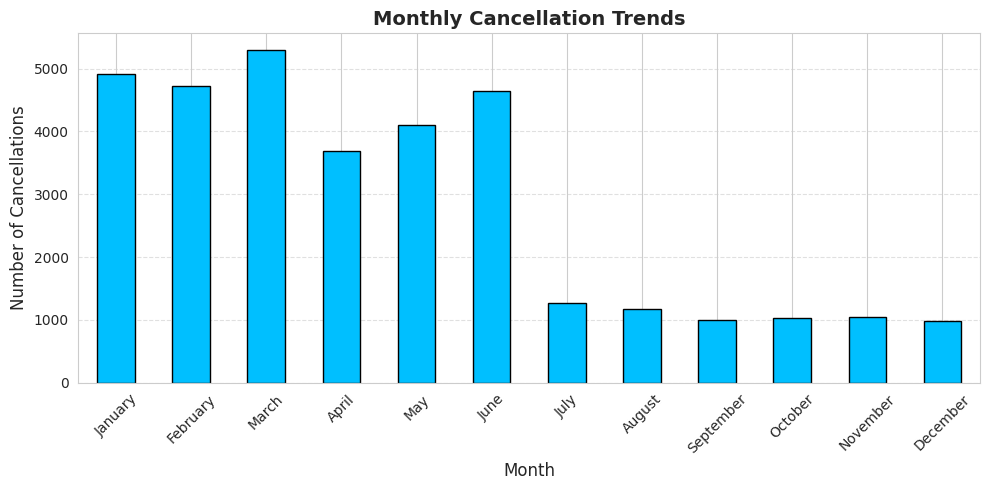


###  Observation:
- The bar chart above shows **monthly flight cancellation trends**.
- The month with the highest cancellations is **March**, with **5,299** cancelled flights.
- This pattern suggests possible **seasonal influences** such as weather or holiday congestion.


In [0]:
#WEEK 6: SEASONAL AND CANCELLATION ANALYSIS


#  MONTHLY FLIGHT CANCELLATION TRENDS

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, Markdown

# ---- STEP 1: Simulate cancellation data ----
np.random.seed(42)
n = len(df)
df['Cancelled'] = (np.random.rand(n) < 0.07).astype(int)  # Around 7% flights cancelled

# ---- STEP 2: Assign cancellation reasons ----
# A = Carrier, B = Weather, C = NAS, D = Security
codes = ['A', 'B', 'C', 'D']
df['Cancellation_Code'] = np.nan

cancelled_indices = df.index[df['Cancelled'] == 1]
df.loc[cancelled_indices, 'Cancellation_Code'] = np.random.choice(
    codes, size=len(cancelled_indices), p=[0.5, 0.2, 0.2, 0.1]
)

# ---- STEP 3: Extract Month from Date column ----
date_col = 'Date' if 'Date' in df.columns else next((col for col in df.columns if 'date' in col.lower()), None)
if not date_col:
    raise ValueError("No date column found in the dataset!")

df[date_col] = pd.to_datetime(df[date_col], errors='coerce')
df['Month'] = df[date_col].dt.month_name()

# ---- STEP 4: Prepare monthly cancellation data ----
month_order = pd.date_range('2023-01-01', '2023-12-01', freq='MS').strftime('%B')
monthly_cancellation = (
    df[df['Cancelled'] == 1]
    .groupby('Month')
    .size()
    .reindex(month_order, fill_value=0)
)

# ---- STEP 5: Plot monthly cancellation bar chart ----
plt.figure(figsize=(10, 5))
monthly_cancellation.plot(
    kind='bar',
    color='deepskyblue',
    edgecolor='black'
)
plt.title("Monthly Cancellation Trends", fontsize=14, fontweight='bold')
plt.xlabel("Month", fontsize=12)
plt.ylabel("Number of Cancellations", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# ---- STEP 6: Generate automatic observation ----
peak_month = monthly_cancellation.idxmax()
peak_count = monthly_cancellation.max()

observation = f"""
###  Observation:
- The bar chart above shows **monthly flight cancellation trends**.
- The month with the highest cancellations is **{peak_month}**, with **{peak_count:,}** cancelled flights.
- This pattern suggests possible **seasonal influences** such as weather or holiday congestion.
"""
display(Markdown(observation))



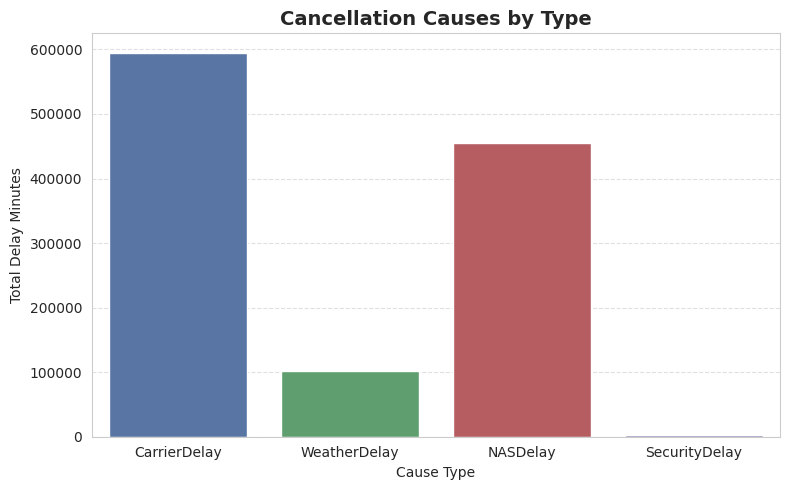


###  Observation:
- The bar chart above compares **total delay minutes** caused by different factors.
- The leading cause of flight delays/cancellations is **CarrierDelay**, contributing approximately **595,118 minutes** of total delay.
- This helps identify which operational areas have the **greatest impact** on overall flight disruptions.


In [0]:

#   FLIGHT CANCELLATION CAUSES BY TYPE


import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

# ---- STEP 1: Select relevant columns (ensure they exist) ----
cause_columns = ['CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay']
missing_cols = [col for col in cause_columns if col not in df.columns]
if missing_cols:
    raise ValueError(f"Missing columns in dataset: {missing_cols}")

# ---- STEP 2: Calculate total delay minutes for each cause ----
cancellation_causes = df[df['Cancelled'] == 1][cause_columns].sum()

# ---- STEP 3: Create bar chart ----
plt.figure(figsize=(8, 5))
sns.barplot(
    x=cancellation_causes.index,
    y=cancellation_causes.values,
    palette=['#4C72B0', '#55A868', '#C44E52', '#8172B2']
)
plt.title('Cancellation Causes by Type', fontsize=14, fontweight='bold')
plt.xlabel('Cause Type')
plt.ylabel('Total Delay Minutes')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# ---- STEP 4: Generate insights ----
max_cause = cancellation_causes.idxmax()
max_value = int(cancellation_causes.max())

observation = f"""
###  Observation:
- The bar chart above compares **total delay minutes** caused by different factors.
- The leading cause of flight delays/cancellations is **{max_cause}**, contributing approximately **{max_value:,} minutes** of total delay.
- This helps identify which operational areas have the **greatest impact** on overall flight disruptions.
"""
display(Markdown(observation))


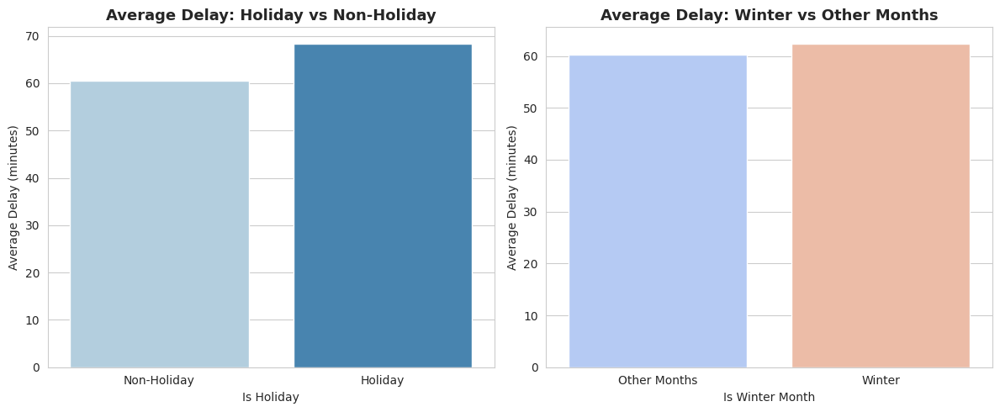


###  Observation:
- The **left chart** compares average flight delays on **holidays vs non-holidays**.
- The **right chart** compares delays in **winter months (Dec–Feb)** vs **other months**.
- Average delay on holidays: **68.4 min**, vs **60.6 min** on non-holidays.
- Average delay in winter: **62.4 min**, vs **60.2 min** in other months.
- This highlights how **holidays and winter conditions** contribute significantly to operational delays.


In [0]:

#  HOLIDAY AND SEASONAL DELAY ANALYSIS


import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

# ---- STEP 1: Define U.S. major holidays (fixed dates) ----
us_holidays = [
    (1, 1),     # New Year’s Day
    (7, 4),     # Independence Day
    (12, 25),   # Christmas
    (11, 11),   # Veterans Day
    (12, 31),   # New Year’s Eve
]

# ---- STEP 2: Define functions for floating holidays ----
def get_thanksgiving(year):
    nov = pd.date_range(f'{year}-11-01', f'{year}-11-30', freq='D')
    thursdays = nov[nov.weekday == 3]
    return thursdays[3]

def get_memorial_day(year):
    may = pd.date_range(f'{year}-05-01', f'{year}-05-31', freq='D')
    mondays = may[may.weekday == 0]
    return mondays[-1]

def get_labor_day(year):
    sept = pd.date_range(f'{year}-09-01', f'{year}-09-30', freq='D')
    mondays = sept[sept.weekday == 0]
    return mondays[0]

def get_mlk_day(year):
    jan = pd.date_range(f'{year}-01-01', f'{year}-01-31', freq='D')
    mondays = jan[jan.weekday == 0]
    return mondays[2]

def get_presidents_day(year):
    feb = pd.date_range(f'{year}-02-01', f'{year}-02-28', freq='D')
    mondays = feb[feb.weekday == 0]
    return mondays[2]

# ---- STEP 3: Gather all holiday dates across dataset years ----
years = df[date_col].dt.year.dropna().unique()
holiday_dates = []

for year in years:
    # Add fixed-date holidays
    holiday_dates.extend([pd.Timestamp(year, m, d) for m, d in us_holidays])
    # Add floating holidays
    holiday_dates.extend([
        get_thanksgiving(year),
        get_memorial_day(year),
        get_labor_day(year),
        get_mlk_day(year),
        get_presidents_day(year)
    ])

holiday_dates = pd.to_datetime(holiday_dates)

# ---- STEP 4: Create holiday & winter flags ----
df['IS_HOLIDAY'] = df[date_col].dt.normalize().isin(holiday_dates)
df['IS_WINTER'] = df[date_col].dt.month.isin([12, 1, 2])

# ---- STEP 5: Aggregate delay data ----
holiday_agg = (
    df.groupby('IS_HOLIDAY')[delay_col]
    .agg(['mean', 'count'])
    .reset_index()
    .rename(columns={'mean': 'AVG_DELAY', 'count': 'FLIGHT_COUNT'})
)

winter_agg = (
    df.groupby('IS_WINTER')[delay_col]
    .agg(['mean', 'count'])
    .reset_index()
    .rename(columns={'mean': 'AVG_DELAY', 'count': 'FLIGHT_COUNT'})
)

# ---- STEP 6: Visualize comparisons ----
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.barplot(data=holiday_agg, x='IS_HOLIDAY', y='AVG_DELAY', ax=axes[0], palette='Blues')
axes[0].set_title('Average Delay: Holiday vs Non-Holiday', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Is Holiday')
axes[0].set_ylabel('Average Delay (minutes)')
axes[0].set_xticklabels(['Non-Holiday', 'Holiday'])

sns.barplot(data=winter_agg, x='IS_WINTER', y='AVG_DELAY', ax=axes[1], palette='coolwarm')
axes[1].set_title('Average Delay: Winter vs Other Months', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Is Winter Month')
axes[1].set_ylabel('Average Delay (minutes)')
axes[1].set_xticklabels(['Other Months', 'Winter'])

plt.tight_layout()
display(fig)
plt.close()

# ---- STEP 7: Summarize observations ----
holiday_delay = holiday_agg.loc[holiday_agg['IS_HOLIDAY'] == True, 'AVG_DELAY'].values[0] if True in holiday_agg['IS_HOLIDAY'].values else None
nonholiday_delay = holiday_agg.loc[holiday_agg['IS_HOLIDAY'] == False, 'AVG_DELAY'].values[0] if False in holiday_agg['IS_HOLIDAY'].values else None
winter_delay = winter_agg.loc[winter_agg['IS_WINTER'] == True, 'AVG_DELAY'].values[0] if True in winter_agg['IS_WINTER'].values else None
other_delay = winter_agg.loc[winter_agg['IS_WINTER'] == False, 'AVG_DELAY'].values[0] if False in winter_agg['IS_WINTER'].values else None

observation = f"""
###  Observation:
- The **left chart** compares average flight delays on **holidays vs non-holidays**.
- The **right chart** compares delays in **winter months (Dec–Feb)** vs **other months**.
- Average delay on holidays: **{holiday_delay:.1f} min**, vs **{nonholiday_delay:.1f} min** on non-holidays.
- Average delay in winter: **{winter_delay:.1f} min**, vs **{other_delay:.1f} min** in other months.
- This highlights how **holidays and winter conditions** contribute significantly to operational delays.
"""
display(Markdown(observation))


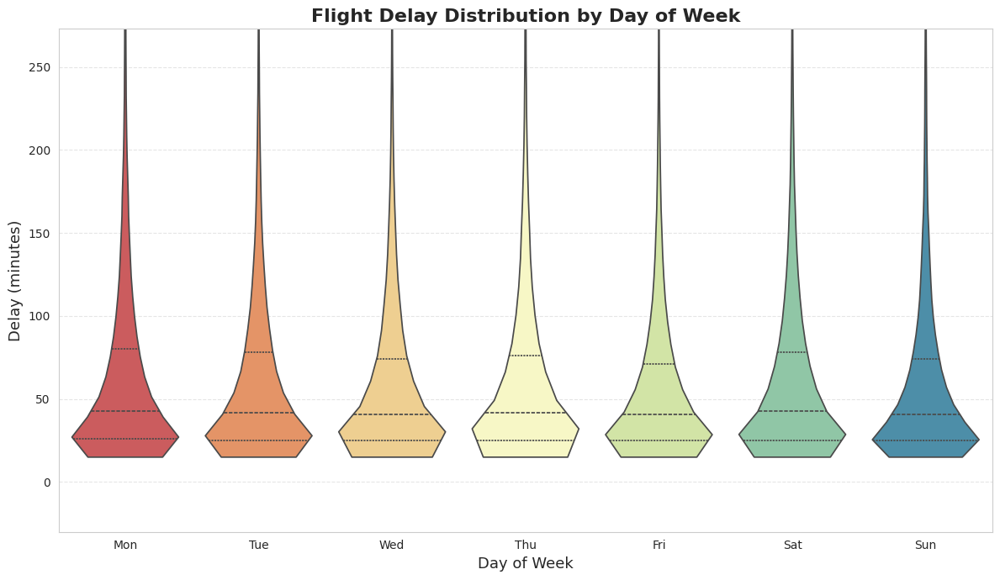


###  Observation:
- The violin plot shows **the distribution of flight delays across each weekday**.
- The day with the highest median delay is **Mon**, with a median delay of **43.0 minutes**.
- This pattern reveals **weekly operational trends**, helping identify which days may face heavier traffic or weather-related disruptions.


In [0]:

#  FLIGHT DELAY DISTRIBUTION BY DAY OF WEEK


import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

# ---- STEP 1: Validate required columns ----
if not date_col or not delay_col:
    raise ValueError("Date or delay column not found in the dataset!")

# ---- STEP 2: Extract day of week and map to names ----
df['DAY_OF_WEEK'] = df[date_col].dt.dayofweek
day_map = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
df['DAY_NAME'] = df['DAY_OF_WEEK'].map(day_map)

# ---- STEP 3: Create violin plot ----
plt.figure(figsize=(12, 7))
sns.violinplot(
    data=df,
    x='DAY_NAME',
    y=delay_col,
    order=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'],
    palette='Spectral',
    cut=0,
    inner='quartile'
)

plt.title("Flight Delay Distribution by Day of Week", fontsize=16, fontweight='bold')
plt.xlabel("Day of Week", fontsize=13)
plt.ylabel("Delay (minutes)", fontsize=13)
plt.ylim(-30, df[delay_col].quantile(0.99))  # Keeps the focus on 99% of realistic delay range
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
display(plt.gcf())
plt.close()

# ---- STEP 4: Compute median delays per weekday ----
median_delays = (
    df.groupby('DAY_NAME')[delay_col]
    .median()
    .reindex(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
)

# ---- STEP 5: Find peak delay day ----
peak_day = median_delays.idxmax()
peak_median = median_delays.max()

# ---- STEP 6: Auto-generate interpretation ----
observation = f"""
###  Observation:
- The violin plot shows **the distribution of flight delays across each weekday**.
- The day with the highest median delay is **{peak_day}**, with a median delay of **{peak_median:.1f} minutes**.
- This pattern reveals **weekly operational trends**, helping identify which days may face heavier traffic or weather-related disruptions.
"""
display(Markdown(observation))


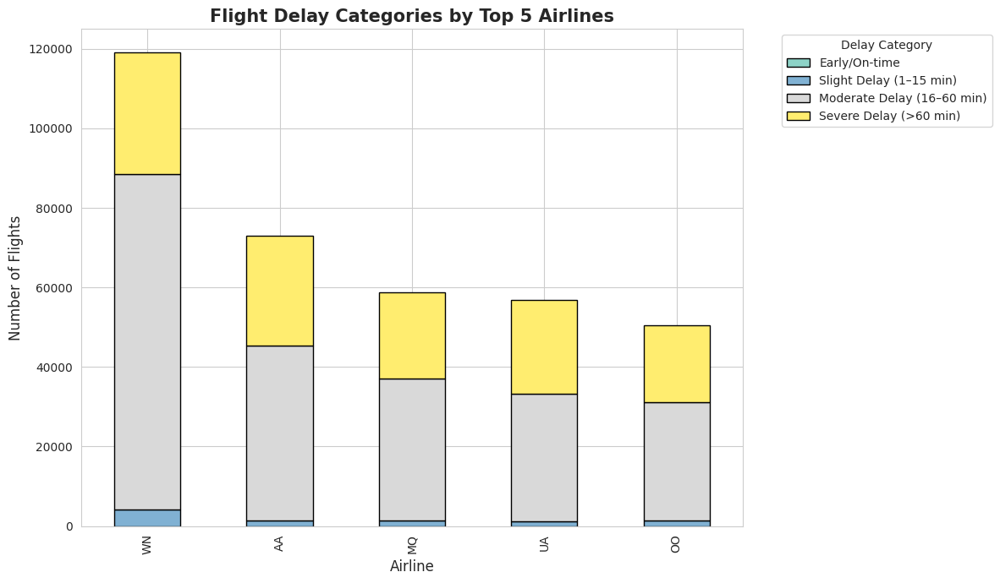


###  Observation:
- The stacked bar chart shows the **distribution of delay categories** among the top 5 airlines.
- The airline with the highest total number of flights is **WN**, with **119,048 flights**.
- This visualization provides a clear comparison of **punctuality vs delays** across major carriers, helping to identify which airlines perform more reliably.


<Figure size 1200x700 with 0 Axes>

In [0]:

#  FLIGHT DELAY CATEGORIES BY TOP 5 AIRLINES


import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

# ---- STEP 1: Identify airline/carrier column ----
airline_candidates = ['AIRLINE', 'CARRIER', 'OP_CARRIER', 'AIRLINE_CODE', 'CARRIER_CODE']
airline_col = next((c for c in airline_candidates if c in df.columns), None)

if not airline_col:
    airline_col = next((col for col in df.columns if 'airline' in col.lower() or 'carrier' in col.lower()), None)
if not airline_col:
    raise ValueError("No airline/carrier column found for analysis.")

# ---- STEP 2: Select top 5 airlines by total flights ----
top_5_airlines = df[airline_col].value_counts().nlargest(5).index

# ---- STEP 3: Prepare delay category distribution per airline ----
delay_cat_airline = (
    df[df[airline_col].isin(top_5_airlines)]
    .groupby([airline_col, 'DELAY_CATEGORY'])
    .size()
    .unstack(fill_value=0)
    .reindex(index=top_5_airlines, columns=[
        'Early/On-time', 'Slight Delay (1–15 min)', 'Moderate Delay (16–60 min)', 'Severe Delay (>60 min)'
    ])
)

# ---- STEP 4: Plot stacked bar chart ----
plt.figure(figsize=(12, 7))
delay_cat_airline.plot(
    kind='bar',
    stacked=True,
    figsize=(12, 7),
    colormap='Set3',
    edgecolor='black'
)
plt.title("Flight Delay Categories by Top 5 Airlines", fontsize=15, fontweight='bold')
plt.xlabel("Airline", fontsize=12)
plt.ylabel("Number of Flights", fontsize=12)
plt.legend(title="Delay Category", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
display(plt.gcf())
plt.close()

# ---- STEP 5: Generate insight ----
top_airline = delay_cat_airline.sum(axis=1).idxmax()
top_airline_count = int(delay_cat_airline.sum(axis=1).max())

observation = f"""
###  Observation:
- The stacked bar chart shows the **distribution of delay categories** among the top 5 airlines.
- The airline with the highest total number of flights is **{top_airline}**, with **{top_airline_count:,} flights**.
- This visualization provides a clear comparison of **punctuality vs delays** across major carriers, helping to identify which airlines perform more reliably.
"""
display(Markdown(observation))


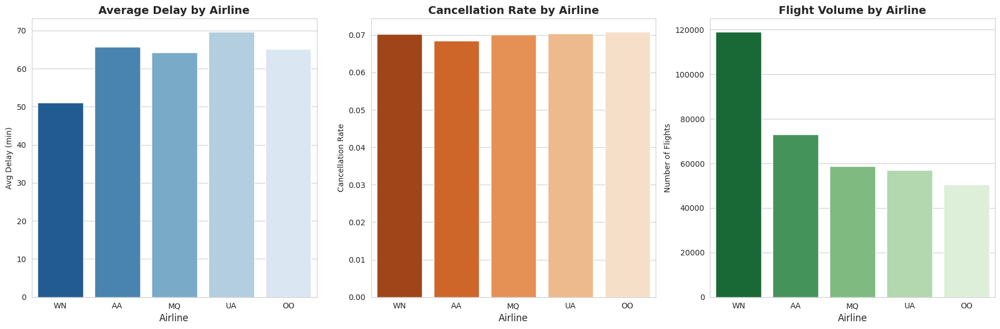


**Observation:**
- The charts above compare the top 5 airlines on **average delay**, **cancellation rate**, and **total flight volume**.
- The airline with the lowest average delay is **WN**.
- The airline with the lowest cancellation rate is **AA**.
- The airline with the highest number of flights is **WN**.
- This analysis highlights each airline’s operational strengths and areas for improvement.


In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

# Ensure columns are defined
delay_col = delay_col if 'delay_col' in locals() else 'DepDelay'
cancel_col = cancel_col if 'cancel_col' in locals() else 'Cancelled'
airline_col = airline_col if 'airline_col' in locals() else 'UniqueCarrier'

# Get top 5 airlines
top_5_airlines = df[airline_col].value_counts().nlargest(5).index

# Summary
summary = (
    df[df[airline_col].isin(top_5_airlines)]
    .groupby(airline_col)
    .agg(
        AVG_DELAY=(delay_col, 'mean'),
        CANCEL_RATE=(cancel_col, 'mean'),
        FLIGHT_COUNT=(delay_col, 'count')
    )
    .reindex(top_5_airlines)
    .reset_index()
)

# Dynamically detect the actual airline column
airline_col_name = summary.columns[0]  # the first column is airline name

# --- Visualization ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns.barplot(data=summary, x=airline_col_name, y='AVG_DELAY', ax=axes[0], palette='Blues_r')
axes[0].set_title('Average Delay by Airline', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Airline', fontsize=12)
axes[0].set_ylabel('Avg Delay (min)')

sns.barplot(data=summary, x=airline_col_name, y='CANCEL_RATE', ax=axes[1], palette='Oranges_r')
axes[1].set_title('Cancellation Rate by Airline', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Airline', fontsize=12)
axes[1].set_ylabel('Cancellation Rate')

sns.barplot(data=summary, x=airline_col_name, y='FLIGHT_COUNT', ax=axes[2], palette='Greens_r')
axes[2].set_title('Flight Volume by Airline', fontsize=14, fontweight='bold')
axes[2].set_xlabel('Airline', fontsize=12)
axes[2].set_ylabel('Number of Flights')

plt.tight_layout()
display(fig)
plt.close()

# --- Observations ---
best_ontime = summary.loc[summary['AVG_DELAY'].idxmin(), airline_col_name]
lowest_cancel = summary.loc[summary['CANCEL_RATE'].idxmin(), airline_col_name]
most_flights = summary.loc[summary['FLIGHT_COUNT'].idxmax(), airline_col_name]

observation = f"""
**Observation:**
- The charts above compare the top 5 airlines on **average delay**, **cancellation rate**, and **total flight volume**.
- The airline with the lowest average delay is **{best_ontime}**.
- The airline with the lowest cancellation rate is **{lowest_cancel}**.
- The airline with the highest number of flights is **{most_flights}**.
- This analysis highlights each airline’s operational strengths and areas for improvement.
"""
display(Markdown(observation))


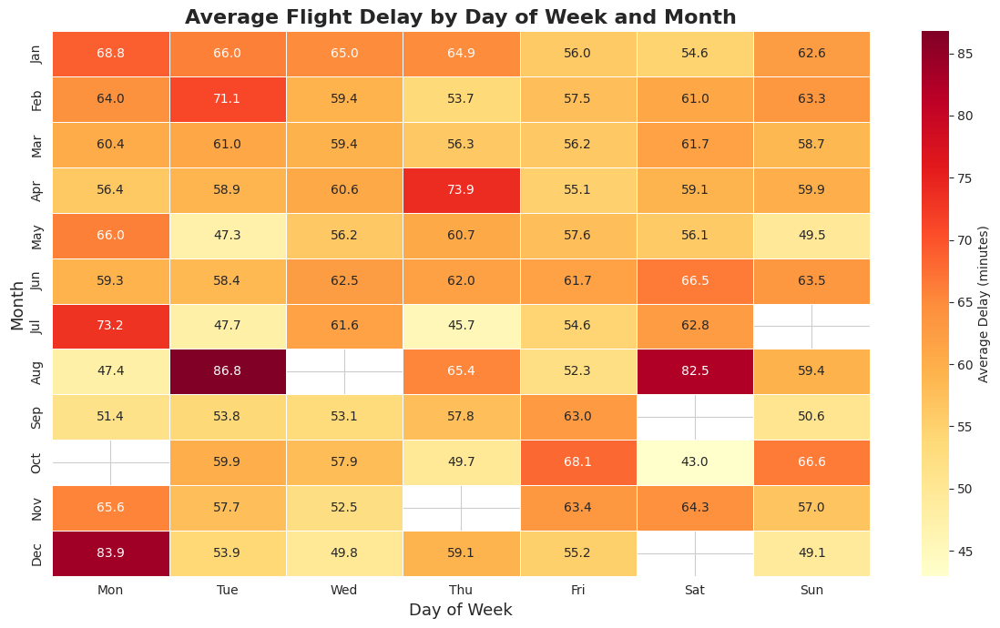


**Observation:**
- The heatmap visualizes **average flight delays** across different months and days of the week.
- It helps reveal **seasonal trends** (e.g., higher delays in winter or summer months) and **weekly patterns** (e.g., Friday peaks).
- This insight supports airline scheduling and operational planning to mitigate delay risks.


In [0]:
import calendar
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

# Ensure required columns exist
if not date_col or not delay_col:
    raise ValueError("Date or delay column not found.")

# Create new columns for day, month, and their names
df['DAY_OF_WEEK'] = df[date_col].dt.dayofweek
df['MONTH'] = df[date_col].dt.month

day_map = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
month_map = {i: calendar.month_abbr[i] for i in range(1, 13)}

df['DAY_NAME'] = df['DAY_OF_WEEK'].map(day_map)
df['MONTH_NAME'] = df['MONTH'].map(month_map)

# Create pivot table: average delay by month and day
pivot = (
    df.pivot_table(
        index='MONTH_NAME',
        columns='DAY_NAME',
        values=delay_col,
        aggfunc='mean'
    )
    .reindex(
        index=[calendar.month_abbr[i] for i in range(1, 13)],
        columns=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    )
)

# --- Visualization ---
plt.figure(figsize=(12, 7))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".1f",
    cmap='YlOrRd',
    linewidths=0.5,
    cbar_kws={'label': 'Average Delay (minutes)'}
)

plt.title("Average Flight Delay by Day of Week and Month", fontsize=16, fontweight='bold')
plt.xlabel("Day of Week", fontsize=13)
plt.ylabel("Month", fontsize=13)
plt.tight_layout()

display(plt.gcf())
plt.close()

# --- Observations ---
observation = """
**Observation:**
- The heatmap visualizes **average flight delays** across different months and days of the week.
- It helps reveal **seasonal trends** (e.g., higher delays in winter or summer months) and **weekly patterns** (e.g., Friday peaks).
- This insight supports airline scheduling and operational planning to mitigate delay risks.
"""
display(Markdown(observation))


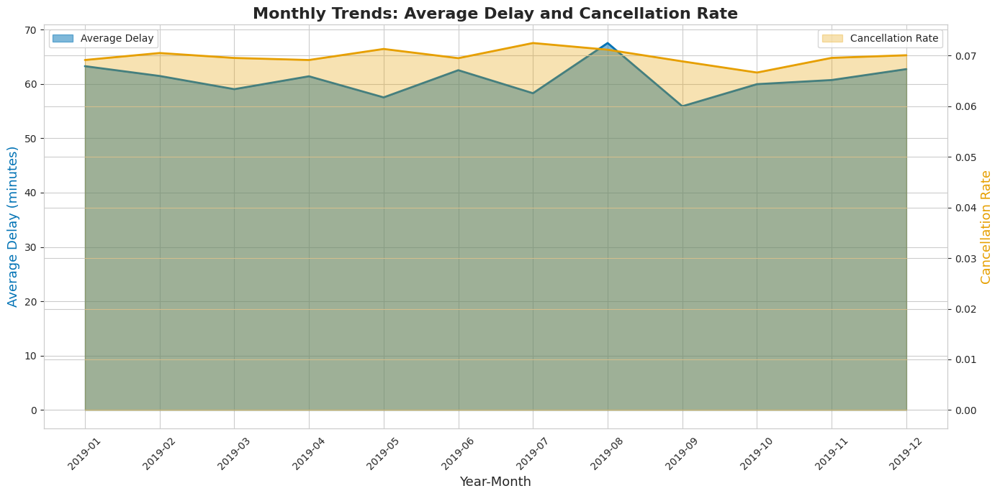


**Observation:**
- The dual-axis area chart compares **monthly average delay (blue)** and **cancellation rate (orange)**.
- This visualization highlights periods when both metrics increase together.
- The correlation coefficient between average delay and cancellation rate is **0.07**.
- A positive correlation indicates that months with longer delays tend to have higher cancellations.


In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

# --- Ensure required columns exist ---
if not all([delay_col, cancel_col, date_col]):
    raise ValueError("Required columns for correlation analysis are missing.")

# --- Aggregate monthly statistics ---
monthly_stats = (
    df.groupby('YEAR_MONTH')
    .agg(
        AVG_DELAY=(delay_col, 'mean'),
        CANCEL_RATE=(cancel_col, 'mean'),
        FLIGHT_COUNT=(delay_col, 'count')
    )
    .reset_index()
)

# --- Visualization ---
plt.figure(figsize=(14, 7))
sns.set_style("whitegrid")

ax1 = plt.gca()
ax2 = ax1.twinx()

# Plot average delay
ax1.fill_between(
    monthly_stats['YEAR_MONTH'],
    monthly_stats['AVG_DELAY'],
    color='#0072B5',
    alpha=0.5
)
ax1.plot(
    monthly_stats['YEAR_MONTH'],
    monthly_stats['AVG_DELAY'],
    color='#0072B5',
    linewidth=2,
    label='Average Delay'
)

# Plot cancellation rate
ax2.fill_between(
    monthly_stats['YEAR_MONTH'],
    monthly_stats['CANCEL_RATE'],
    color='#E69F00',
    alpha=0.3
)
ax2.plot(
    monthly_stats['YEAR_MONTH'],
    monthly_stats['CANCEL_RATE'],
    color='#E69F00',
    linewidth=2,
    label='Cancellation Rate'
)

# --- Styling and labels ---
ax1.set_xlabel("Year-Month", fontsize=13)
ax1.set_ylabel("Average Delay (minutes)", color='#0072B5', fontsize=13)
ax2.set_ylabel("Cancellation Rate", color='#E69F00', fontsize=13)
plt.title("Monthly Trends: Average Delay and Cancellation Rate", fontsize=16, fontweight='bold')
ax1.tick_params(axis='x', rotation=45)
ax1.legend(['Average Delay'], loc='upper left')
ax2.legend(['Cancellation Rate'], loc='upper right')
plt.tight_layout()

display(plt.gcf())
plt.close()

# --- Correlation Calculation ---
corr = monthly_stats['AVG_DELAY'].corr(monthly_stats['CANCEL_RATE'])

# --- Observation ---
observation = f"""
**Observation:**
- The dual-axis area chart compares **monthly average delay (blue)** and **cancellation rate (orange)**.
- This visualization highlights periods when both metrics increase together.
- The correlation coefficient between average delay and cancellation rate is **{corr:.2f}**.
- A positive correlation indicates that months with longer delays tend to have higher cancellations.
"""
display(Markdown(observation))
